Лабораторная работа №1 Джага А.О.

In [3]:
from matplotlib import pyplot as plt
import numpy as np
from numpy import linalg as la
from datetime import datetime
from sympy.abc import x, y
from sympy import *

Выбрать тестовые функции оптимизации (2 шт)

In [4]:
# Ищем частные производные функции Матьяса
f = 0.26 * (x**2 + y**2) - 0.48 * x * y
print(diff(f,x))
print(diff(f,y))

0.52*x - 0.48*y
-0.48*x + 0.52*y


In [5]:
# Ищем частные производные функции Леви N 13
import math
Pi = math.pi
f = (sin(3*Pi*x))**2 + ((x-1)**2)*(1+(sin(3*Pi*y))**2) + ((y-1)**2)*(1+(sin(2*Pi*y))**2)
print(diff(f,x))
print(diff(f,y))

(2*x - 2)*(sin(9.42477796076938*y)**2 + 1) + 18.8495559215388*sin(9.42477796076938*x)*cos(9.42477796076938*x)
18.8495559215388*(x - 1)**2*sin(9.42477796076938*y)*cos(9.42477796076938*y) + 12.5663706143592*(y - 1)**2*sin(6.28318530717959*y)*cos(6.28318530717959*y) + (2*y - 2)*(sin(6.28318530717959*y)**2 + 1)


Задаем функцию Матьяса

In [6]:
class Matyas():
  @staticmethod
  def fuction(x):
        return 0.26 * (x[0]**2 + x[1]**2) - 0.48 * x[0] * x[1]

# Определим допустимый диапазаон входных данных
  @staticmethod
  def get_bounds():
    return np.array([[-10, -10], [10, 10]])

# Определим минимумы
  @staticmethod
  def get_min():
        return np.array([0, 0, 0])

  @staticmethod
  def gradient(x):
        return np.array([0.52*x[0] - 0.48*x[1], 0.48*x[0] + 0.52*x[1]])

Задаем функцию Леви N 13

In [7]:
class Levi():
  @staticmethod
  def fuction(x):
        return (np.sin(3*float(Pi)*x[0]))**2 + ((x[0]-1)**2)*(1+(np.sin(3*float(Pi)*x[1]))**2) + ((x[1]-1)**2)*(1+(np.sin(2*float(Pi)*x[1]))**2)

# Определим допустимый диапазаон входных данных
  @staticmethod
  def get_bounds():
    return np.array([[-10, -10], [10, 10]])

# Определим минимумы
  @staticmethod
  def get_min():
        return np.array([1, 1, 0])

  @staticmethod
  def gradient(x):
        return np.array([(2*x[0] - 2)*(np.sin(9.42477796076938*x[1])**2 + 1) + 18.8495559215388*np.sin(9.42477796076938*x[0])*np.cos(9.42477796076938*x[0]),
                         18.8495559215388*(x[0] - 1)**2*np.sin(9.42477796076938*x[1])*np.cos(9.42477796076938*x[1]) + 12.5663706143592*(x[1] - 1)**2*np.sin(6.28318530717959*x[1])*np.cos(6.28318530717959*x[1]) + (2*x[1] - 2)*(np.sin(6.28318530717959*x[1])**2 + 1)])

Функция визуализации

Алгоритм действия функции:

* Создается фигура и трехмерная система координат.
* Создается сетка значений функции в области определения.
* На графике отображается поверхность функции.
* На графике отображается траектория градиентного спуска.
* На графике отмечаются начальная и конечная точки градиентного спуска.
* Выводится информация о результатах градиентного спуска.

In [8]:
def draw_result(func: callable, bounds: np.array, glob_min: np.array, history: np.array, title: str) -> None:

# func (callable): функция искуственного ландшафта
# bounds (np.array): область определения функции
# glob_min (np.array): глобальный минимум функции
# history (np.array): история градиентного спуска
# title (str): заголовок графика

    fig = plt.figure(figsize = (10, 10))
    ax = plt.axes(projection = '3d')

    x = np.linspace(bounds[0, 0], bounds[1, 0], 100)
    y = np.linspace(bounds[0, 1], bounds[1, 1], 100)

    x_grid, y_grid = np.meshgrid(x, y)
    z_grid = func(np.array([x_grid, y_grid]))

    ax.plot_surface(x_grid, y_grid, z_grid, cmap = 'nipy_spectral_r', alpha=0.5)
    ax.plot(history[:, 0], history[:, 1], history[:, 2], '-', c='black', alpha = 1)
    ax.scatter3D(history[0, 0], history[0, 1], history[0, 2], s=250, c="white", lw=2, ec='black', marker = '.')
    ax.scatter3D(history[-1, 0], history[-1, 1], history[-1, 2], s=250, c="white", lw=2, ec='black', marker = '*')

    np.set_printoptions(formatter={'float_kind':"{:.2f}".format})
    print(f"Начальная точка:\t{history[0]}")
    np.set_printoptions(formatter={'float_kind':"{:.2e}".format})
    print(f"Найденный минимум:\t{history[-1]}")
    print(f"Глобальный минимум:\t{glob_min}")
    print(f"Погрешность:\t{(glob_min-history[-1])}")
    print(f"Кол-во итераций:\t{len(history)}")
    fig.text(0.9, 0.1, s=f"Кол-во итераций: {len(history)}", horizontalalignment="right", fontsize = 12)

    ax.set_title(title, fontsize = 12, fontweight="bold",loc="left")
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')

Классический GD

In [9]:
def CGD(
    func: callable, grad: callable, start_params: np.ndarray, glob_min: np.ndarray,
    max_iter: int = 1000, lr: float = 0.1, delta: float = 0.001
    ) -> np.array:

    # Градиентный спуск
    # Args:
    #     func (callable): функция искуственного ландшафта
    #     start_params (np.ndarray): стартовый набор параметров
    #     glob_min (np.ndarray): глобальный минимум рассматриваемой функции
    #     max_iter (int, optional): ограничение по кол-ву итераций. Defaults to 1000.
    #     lr=learning_rate (float, optional): шаг обучения. Defaults to 0.1.
    #     delta (float, optional): радиус сходимости. Defaults to 0.001.
    # Returns:
    #     np.array: история градиентного спуска

    # Инициализируем начальный набор параметров params и историю градиентного спуска history
    params = start_params.copy()
    history = [np.array([params[0], params[1], func(params)])]

    # Запустим цикл, который будет повторяться, пока не будет достигнуто одно из двух условий:
    # 1. Количество итераций достигло максимального значения (max_iter)
    # 2. Расстояние между текущей точкой и глобальным минимумом меньше заданного минимального значения (delta)
    step = 0
    while (step < max_iter and la.norm(history[-1] - glob_min) > delta):

        # новое значение параметров
        params = params - lr * grad(params)

        # сохраняем результат
        history.append(np.array([params[0], params[1], func(params)]))
        step += 1

    return np.array(history)

In [10]:
def visualize(f, x_min, x_max, y_min, y_max):
    # Cоздадим массив чисел x, равномерно распределенных в диапазоне от x_min до x_max
    x = np.linspace(x_min, x_max)
    y = f(x)

    # Создадим фигуру и систему координат для построения графика.
    fig, ax = plt.subplots()
    # Построим график
    ax.plot(x, y)
    plt.ylim(y_min, y_max)
    plt.xlim(x)

Matyas default сgd
 0:00:00.119497
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[2.99e-02 2.50e-02 3.63e-05]
Глобальный минимум:	[0 0 0]
Погрешность:	[-2.99e-02 -2.50e-02 -3.63e-05]
Кол-во итераций:	10001
Matyas default сgd
 0:00:00.115943
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[2.99e-02 2.50e-02 3.63e-05]
Глобальный минимум:	[0 0 0]
Погрешность:	[-2.99e-02 -2.50e-02 -3.63e-05]
Кол-во итераций:	10001
Matyas default сgd
 0:00:00.121484
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[2.99e-02 2.50e-02 3.63e-05]
Глобальный минимум:	[0 0 0]
Погрешность:	[-2.99e-02 -2.50e-02 -3.63e-05]
Кол-во итераций:	10001
Matyas default сgd
 0:00:00.123507
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[2.99e-02 2.50e-02 3.63e-05]
Глобальный минимум:	[0 0 0]
Погрешность:	[-2.99e-02 -2.50e-02 -3.63e-05]
Кол-во итераций:	10001
Matyas default сgd
 0:00:00.118228
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[2.99e-02 2.50e-02 3.63e-05]
Глобальный минимум:	[

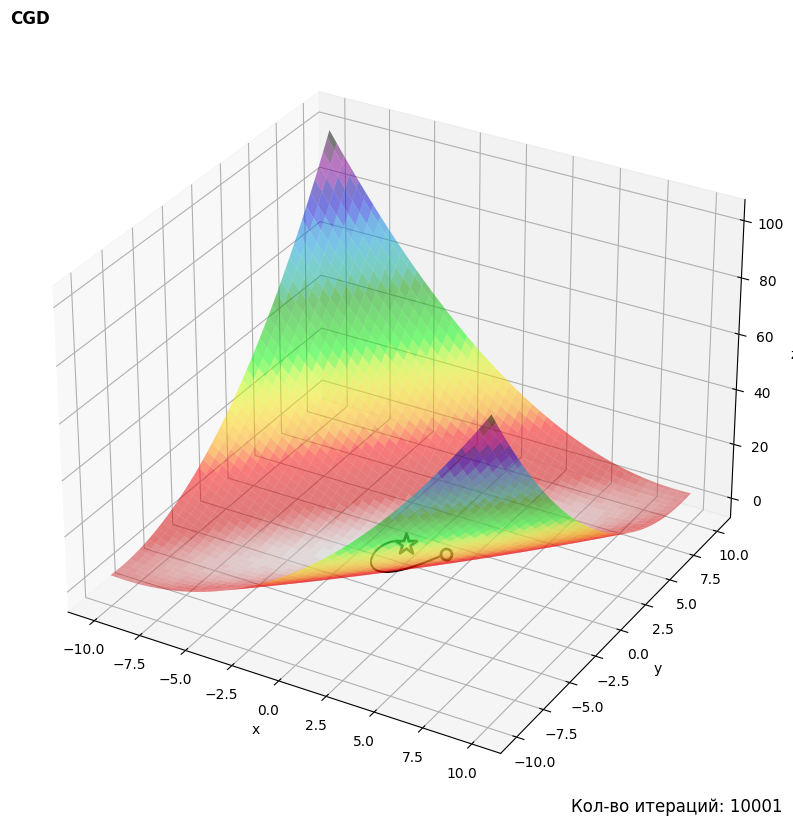

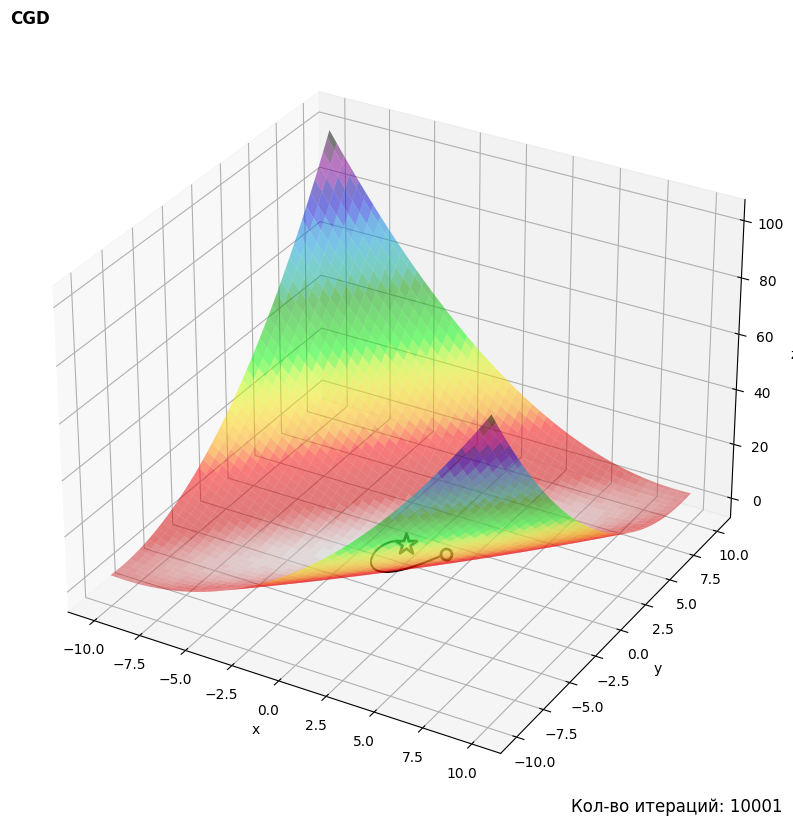

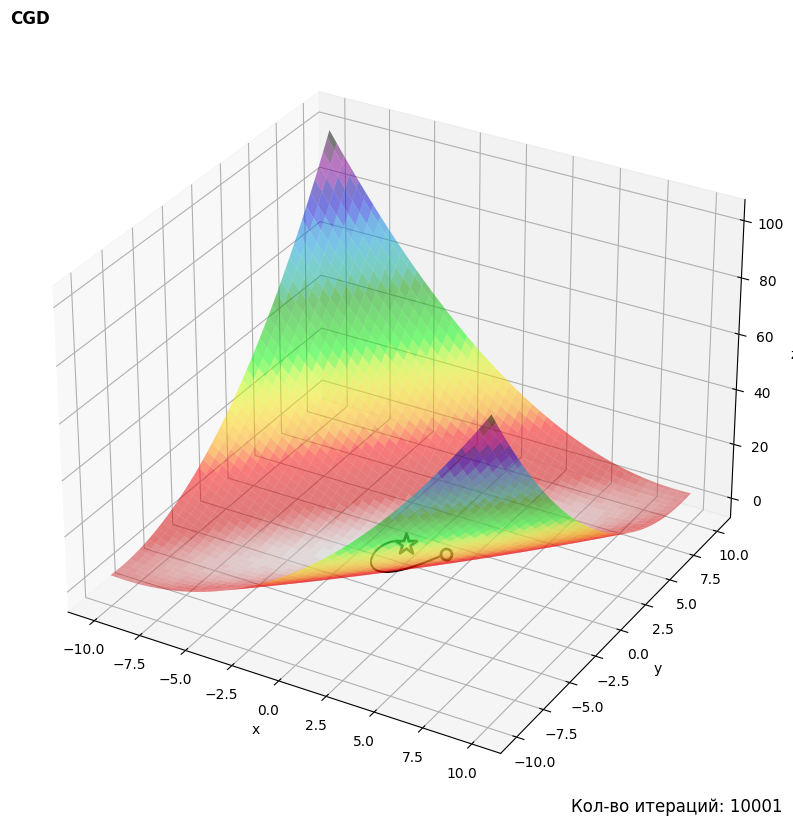

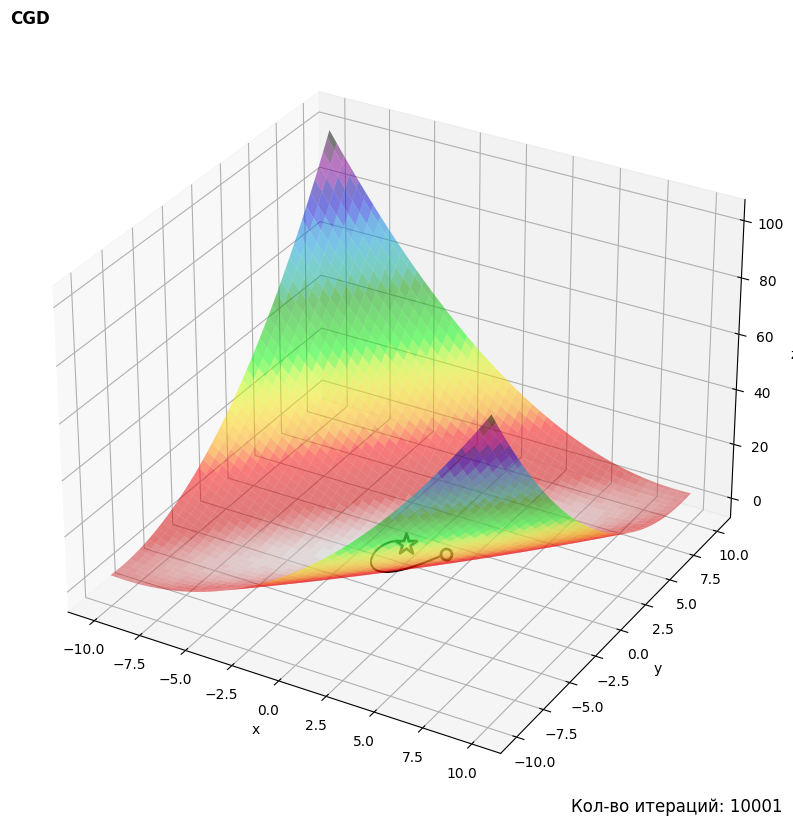

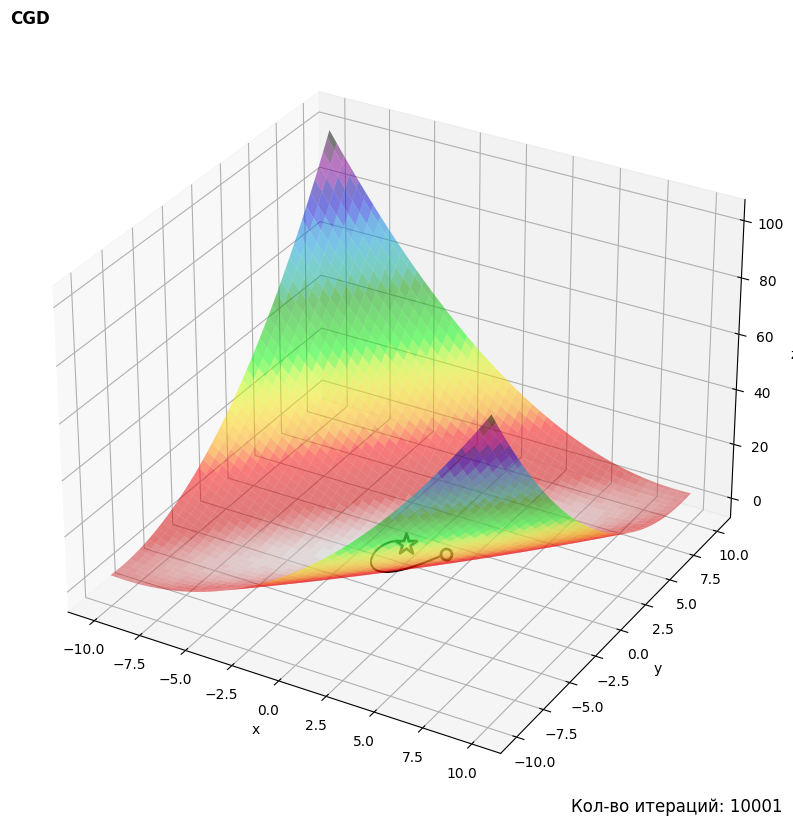

In [11]:
# Для Матьяса по одной и той же начальной точке
for _ in range(5):
  start_time = datetime.now()
  history = CGD(Matyas.fuction, Matyas.gradient, np.array([5,-5]), Matyas.get_min(), max_iter = 10000, lr = 0.001)
  print("Matyas default сgd\n", datetime.now() - start_time)
  draw_result(Matyas.fuction, Matyas.get_bounds(), Matyas.get_min(), history, "СGD")

Matyas cgd
 0:00:00.152969
Начальная точка:	[-1.00 1.00 1.00]
Найденный минимум:	[-5.99e-03 -5.00e-03 1.45e-06]
Глобальный минимум:	[0 0 0]
Погрешность:	[5.99e-03 5.00e-03 -1.45e-06]
Кол-во итераций:	10001
Matyas cgd
 0:00:00.126762
Начальная точка:	[-2.00 2.00 4.00]
Найденный минимум:	[-1.20e-02 -9.99e-03 5.81e-06]
Глобальный минимум:	[0 0 0]
Погрешность:	[1.20e-02 9.99e-03 -5.81e-06]
Кол-во итераций:	10001
Matyas cgd
 0:00:00.138010
Начальная точка:	[-3.00 3.00 9.00]
Найденный минимум:	[-1.80e-02 -1.50e-02 1.31e-05]
Глобальный минимум:	[0 0 0]
Погрешность:	[1.80e-02 1.50e-02 -1.31e-05]
Кол-во итераций:	10001
Matyas cgd
 0:00:00.223514
Начальная точка:	[-4.00 4.00 16.00]
Найденный минимум:	[-2.40e-02 -2.00e-02 2.33e-05]
Глобальный минимум:	[0 0 0]
Погрешность:	[2.40e-02 2.00e-02 -2.33e-05]
Кол-во итераций:	10001
Matyas cgd
 0:00:00.211383
Начальная точка:	[-5.00 -5.00 1.00]
Найденный минимум:	[2.50e-02 -2.99e-02 7.55e-04]
Глобальный минимум:	[0 0 0]
Погрешность:	[-2.50e-02 2.99e-02 -7

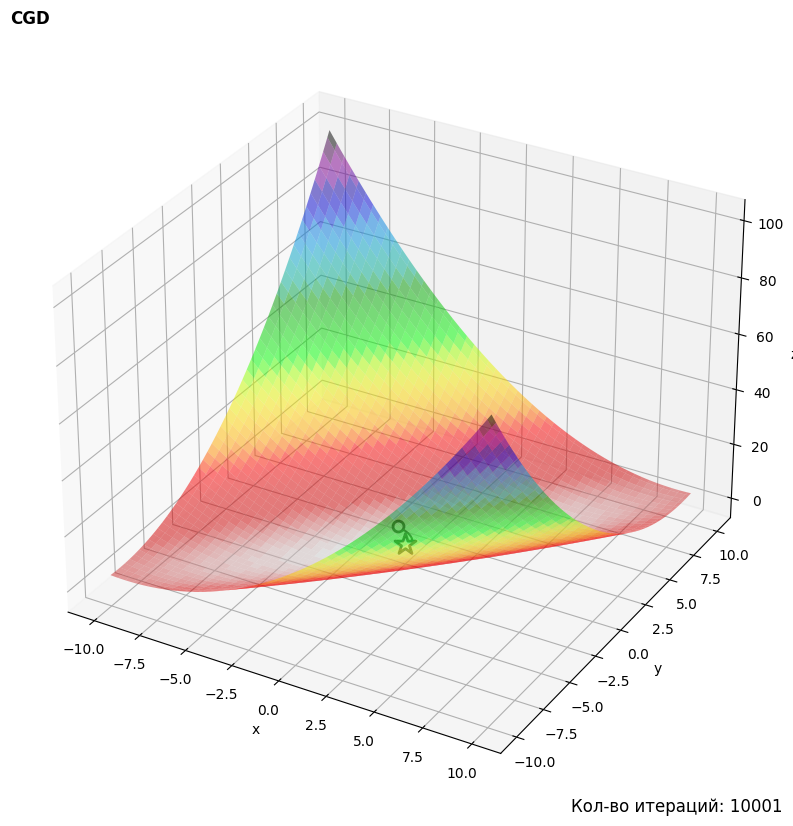

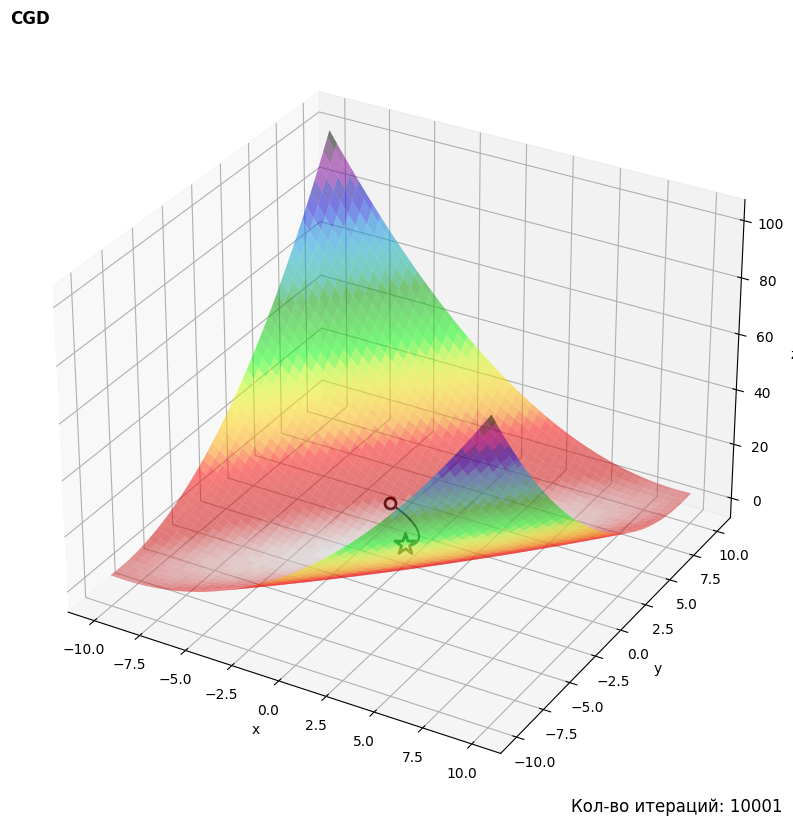

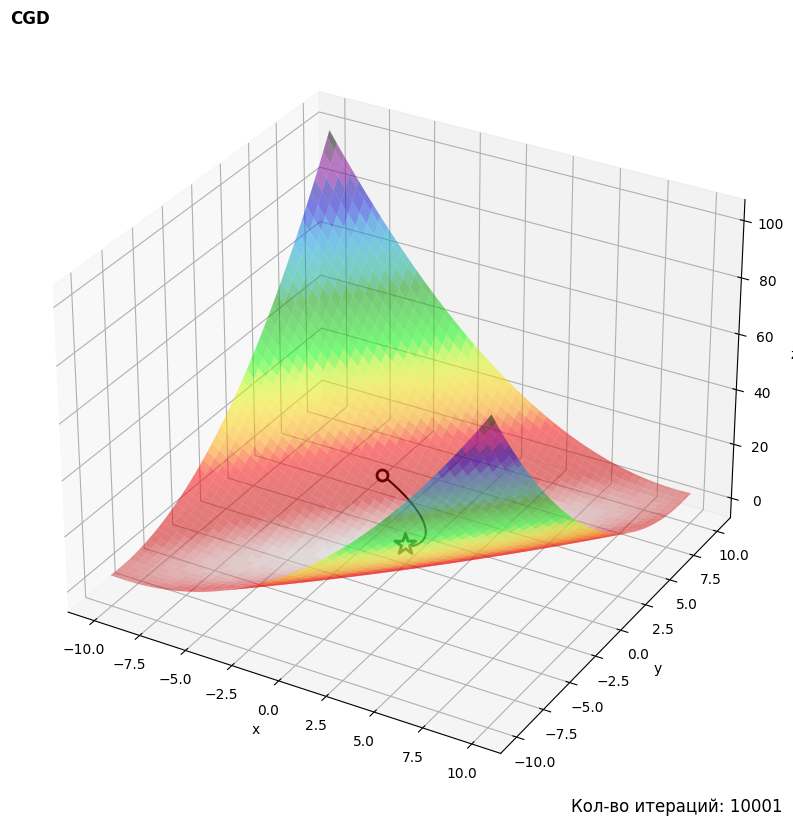

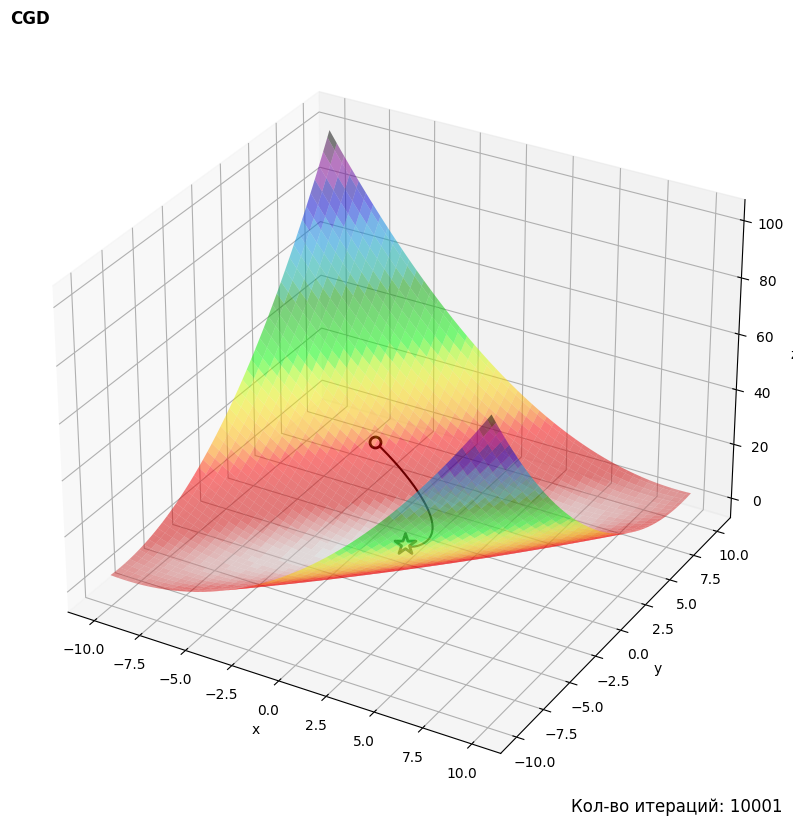

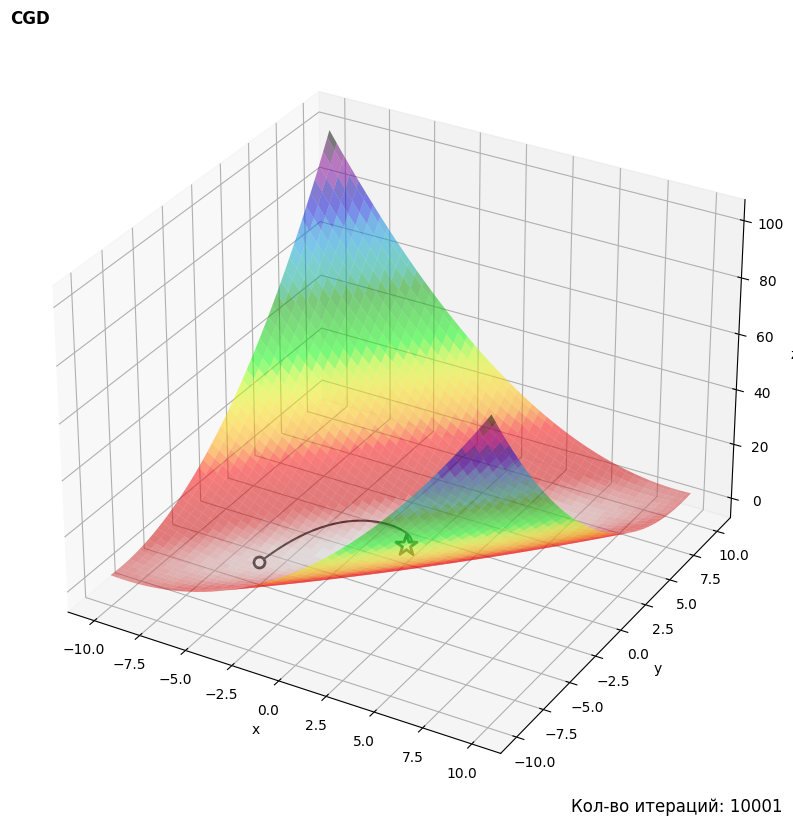

In [12]:
# Для Матьяса по нескольким начальным точкам
initial_points = [[-1, 1], [-2, 2], [-3, 3], [-4, 4], [-5,-5]]
for i in initial_points:
  start_time = datetime.now()
  history = CGD(Matyas.fuction, Matyas.gradient, i, Matyas.get_min(), max_iter = 10000, lr = 0.001, delta=0.00001)
  print("Matyas cgd\n", datetime.now() - start_time)
  draw_result(Matyas.fuction, Matyas.get_bounds(), Matyas.get_min(), history, "СGD")

Levi default сgd
 0:00:00.364196
Начальная точка:	[5.00 -5.00 52.00]
Найденный минимум:	[3.27e+00 -4.49e+00 4.08e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[-2.27e+00 5.49e+00 -4.08e+01]
Кол-во итераций:	10001
Levi default сgd
 0:00:00.268088
Начальная точка:	[5.00 -5.00 52.00]
Найденный минимум:	[3.27e+00 -4.49e+00 4.08e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[-2.27e+00 5.49e+00 -4.08e+01]
Кол-во итераций:	10001
Levi default сgd
 0:00:00.284818
Начальная точка:	[5.00 -5.00 52.00]
Найденный минимум:	[3.27e+00 -4.49e+00 4.08e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[-2.27e+00 5.49e+00 -4.08e+01]
Кол-во итераций:	10001
Levi default сgd
 0:00:00.276769
Начальная точка:	[5.00 -5.00 52.00]
Найденный минимум:	[3.27e+00 -4.49e+00 4.08e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[-2.27e+00 5.49e+00 -4.08e+01]
Кол-во итераций:	10001
Levi default сgd
 0:00:00.291220
Начальная точка:	[5.00 -5.00 52.00]
Найденный минимум:	[3.27e+00 -4.49e+00 4.08e+01]
Глобальный минимум:	[1 1 0]
По

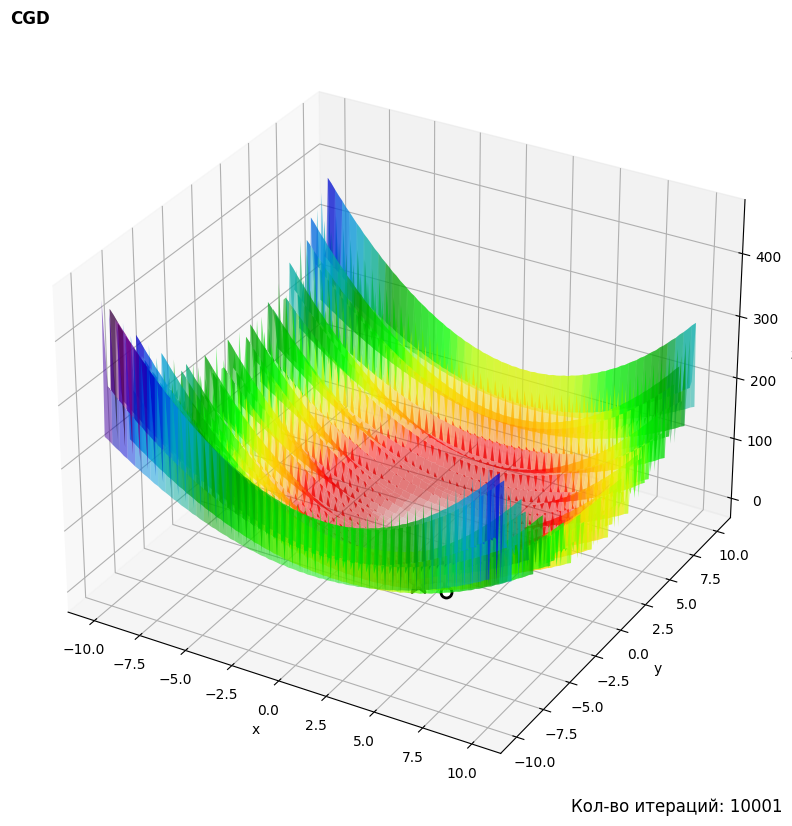

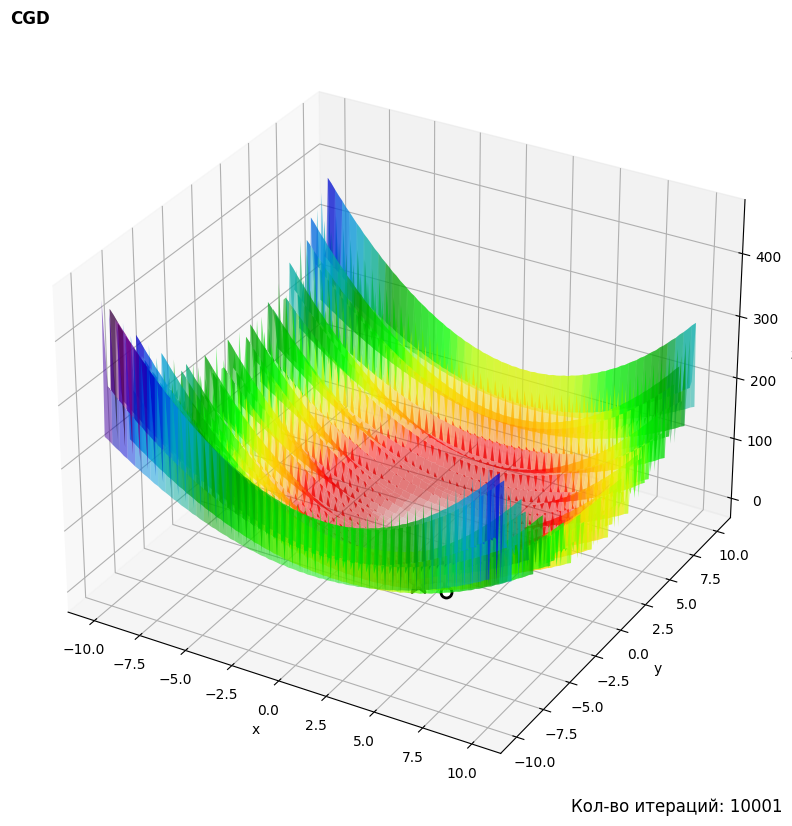

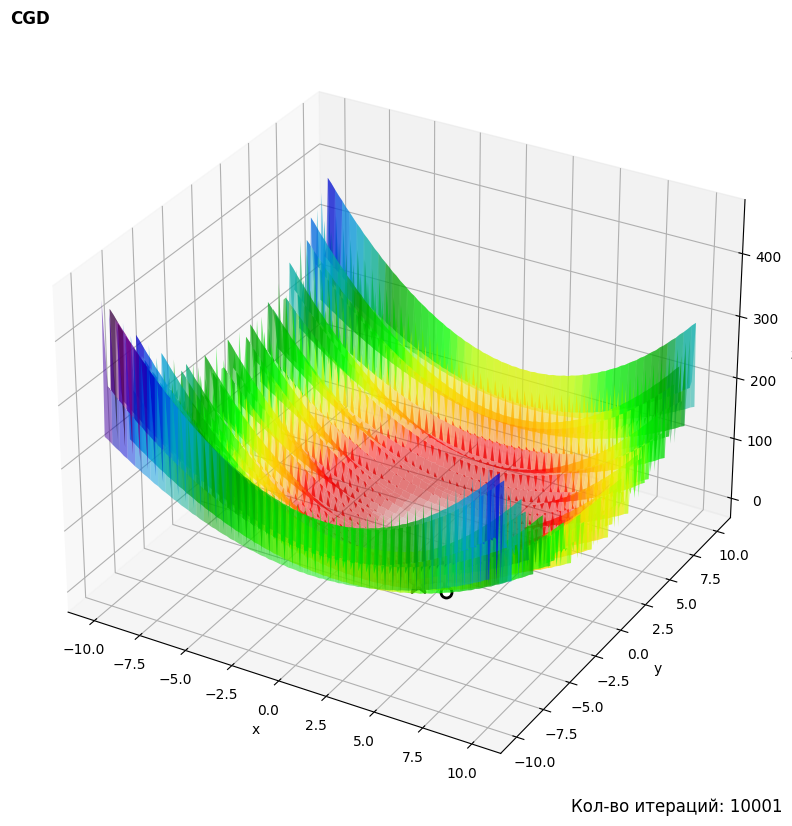

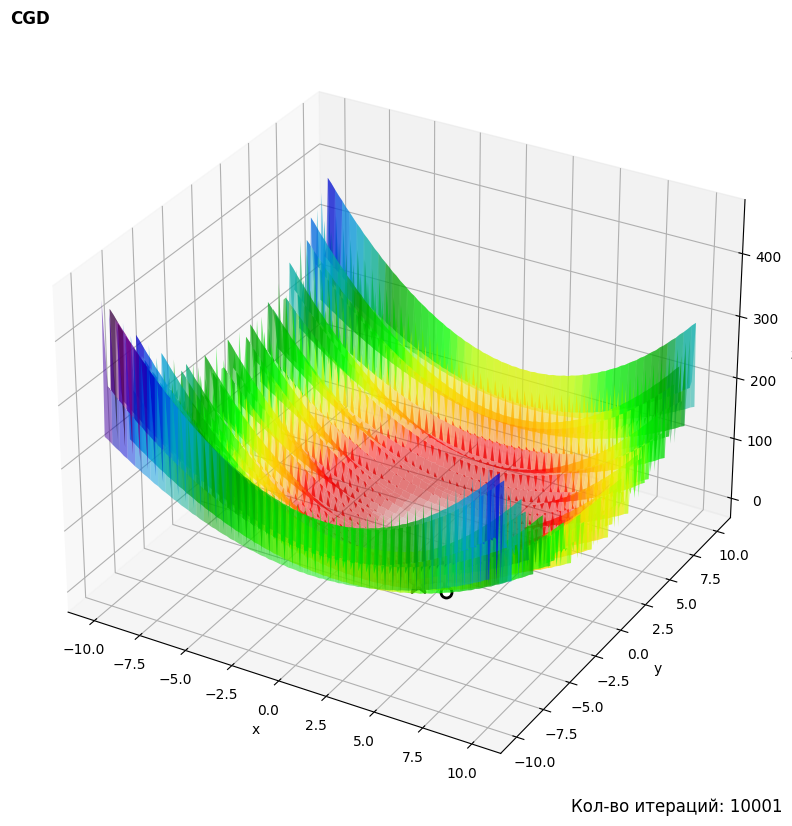

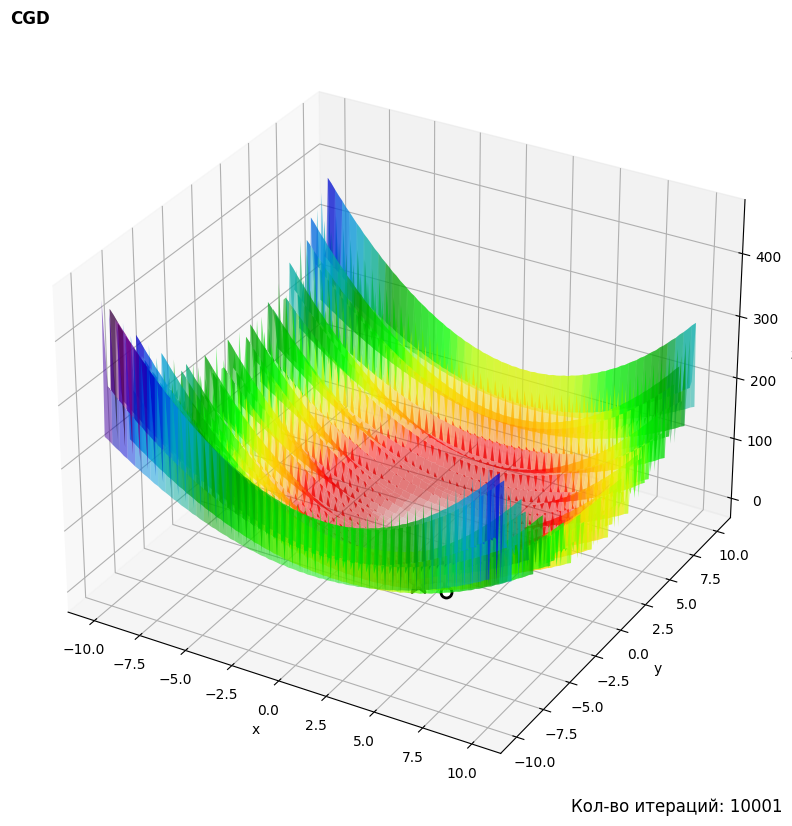

In [13]:
# Для Леви по одной и той же начальной точке
for _ in range(5):
  start_time = datetime.now()
  history = CGD(Levi.fuction, Levi.gradient, np.array([5,-5]), Levi.get_min(), max_iter = 10000, lr = 0.001)
  print("Levi default сgd\n", datetime.now() - start_time)
  draw_result(Levi.fuction, Levi.get_bounds(), Levi.get_min(), history, "СGD")

Levi cgd
 0:00:00.322886
Начальная точка:	[-1.00 1.00 4.00]
Найденный минимум:	[-9.77e-01 1.00e+00 3.95e+00]
Глобальный минимум:	[1 1 0]
Погрешность:	[1.98e+00 0.00e+00 -3.95e+00]
Кол-во итераций:	10001
Levi cgd
 0:00:00.269271
Начальная точка:	[-2.00 2.00 10.00]
Найденный минимум:	[-1.96e+00 2.00e+00 9.89e+00]
Глобальный минимум:	[1 1 0]
Погрешность:	[2.96e+00 -9.99e-01 -9.89e+00]
Кол-во итераций:	10001
Levi cgd
 0:00:00.279153
Начальная точка:	[-3.00 3.00 20.00]
Найденный минимум:	[-2.28e+00 3.04e+00 1.69e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[3.28e+00 -2.04e+00 -1.69e+01]
Кол-во итераций:	10001
Levi cgd
 0:00:00.396677
Начальная точка:	[-4.00 4.00 34.00]
Найденный минимум:	[-2.93e+00 4.32e+00 3.60e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[3.93e+00 -3.32e+00 -3.60e+01]
Кол-во итераций:	10001
Levi cgd
 0:00:00.791744
Начальная точка:	[-5.00 -5.00 72.00]
Найденный минимум:	[-1.27e+00 -4.49e+00 4.08e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[2.27e+00 5.49e+00 -4.08e+01]

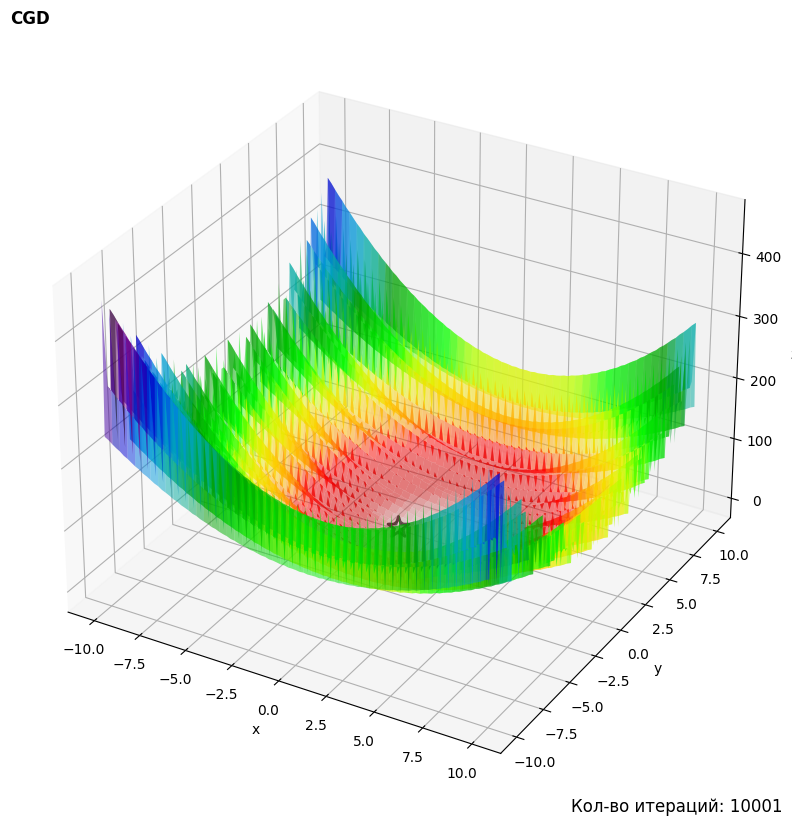

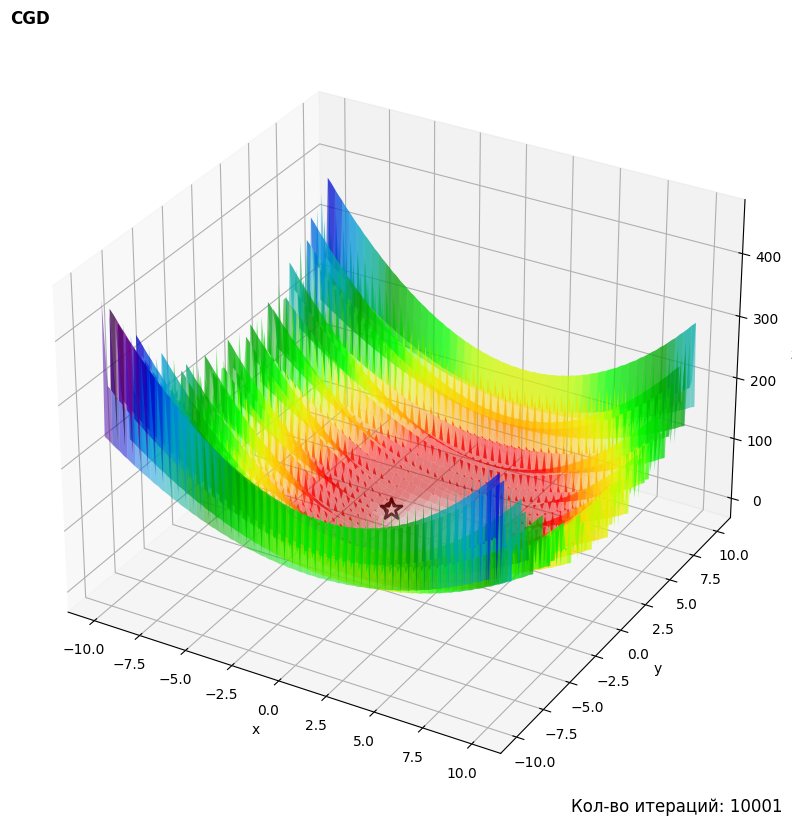

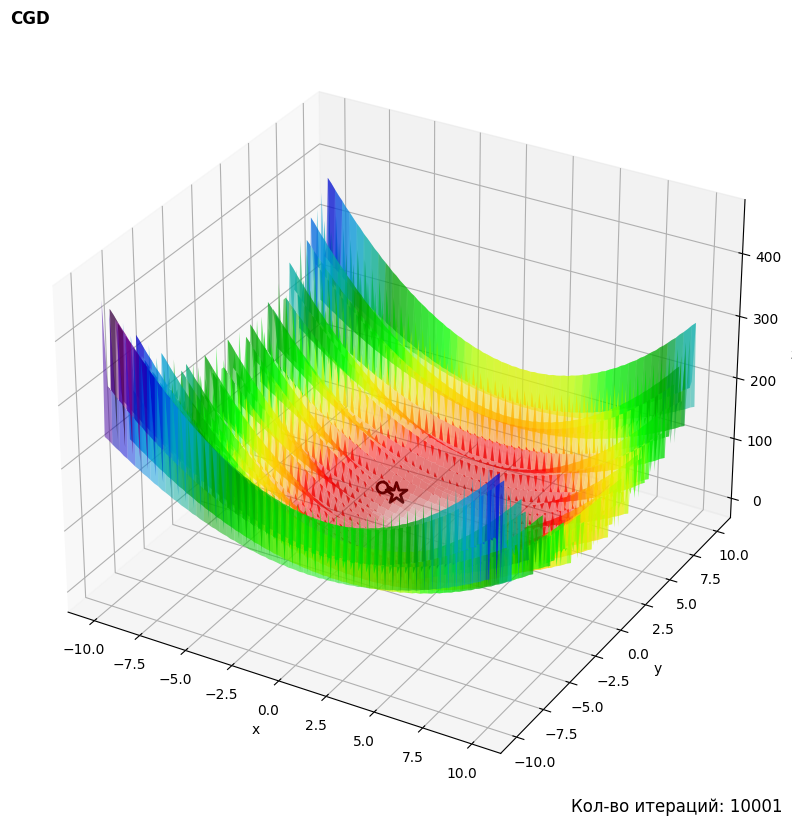

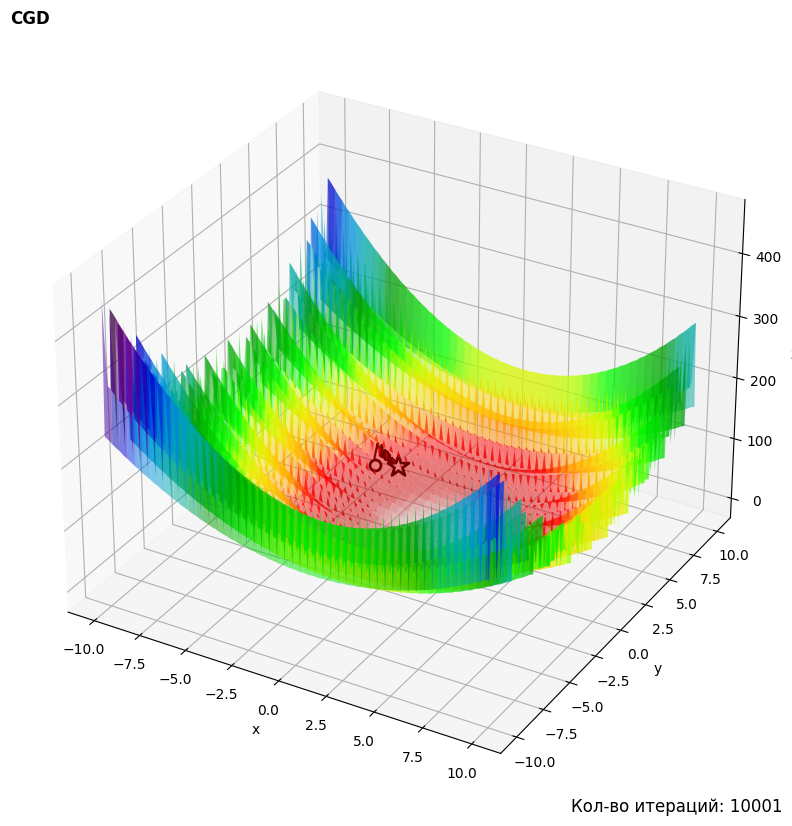

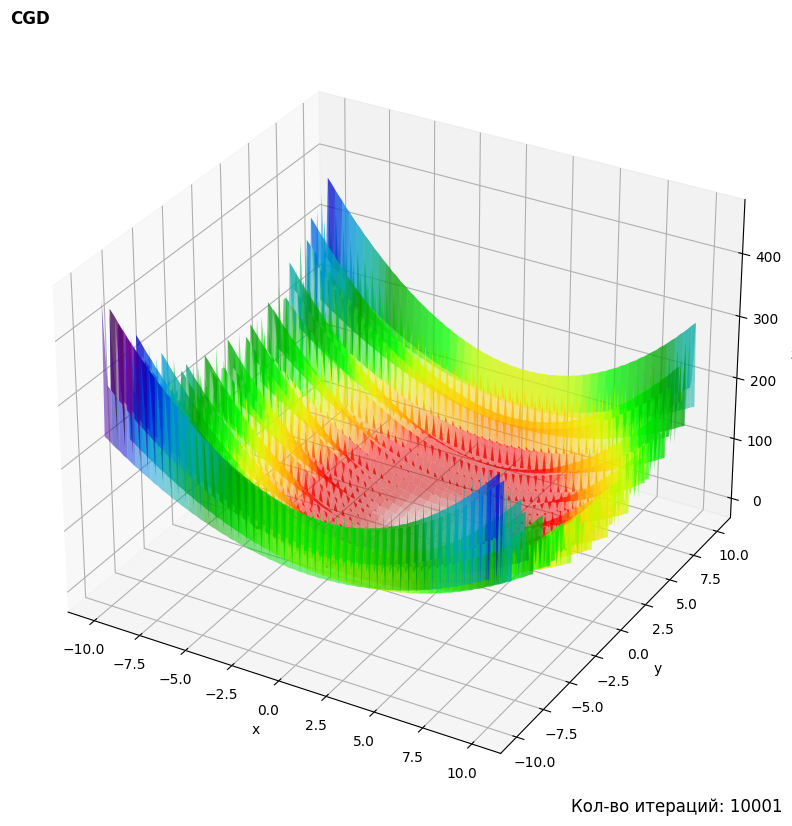

In [14]:
# Для Леви по нескольким начальным точкам
initial_points = [[-1, 1], [-2, 2], [-3, 3], [-4, 4], [-5,-5]]
for i in initial_points:
  start_time = datetime.now()
  history = CGD(Levi.fuction, Levi.gradient, i, Levi.get_min(), max_iter = 10000, lr = 0.001, delta=0.00001)
  print("Levi cgd\n", datetime.now() - start_time)
  draw_result(Levi.fuction, Levi.get_bounds(), Levi.get_min(), history, "СGD")

Запрограммировать метод вычисления градиента

Передача функции градиента от пользователя
Символьное вычисление градиента (например с помощью sympy) (на доп балл)
Численная аппроксимация градиента (на доп балл)

Введите выражение, переменные задавайте в виде x, y: x**2 + y**2
Ваша функция gd
 0:00:09.371901
[7.06e-04 7.06e-04 9.98e-07]


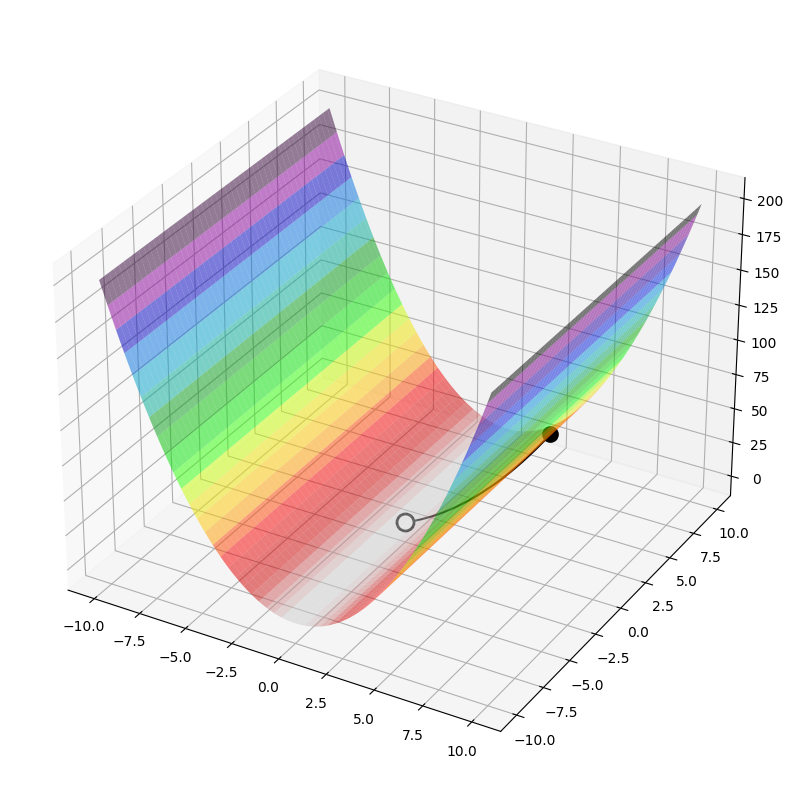

In [15]:
# Определение символов: Создаются символы x и y
# для представления переменных в выражении.
x, y = symbols('x y')
global Func
expn = input("Введите выражение, переменные задавайте в виде x, y: ")
Func = expn

# Символьное выражение преобразуется в объект SymPy с помощью sympify()
# и сохраняется в переменной gfg
gfg = sympify(Func)
def function(fx):
    substitutions = {x: fx[0], y: fx[1]}
    return float(gfg.subs(substitutions))

def get_bounds(xy_min):
    return np.array([[xy_min[0] - 10, xy_min[1] - 10], [xy_min[0] + 10, xy_min[1] + 10]])

# Возвращает массив NumPy с тремя нулями,
# который используется в качестве ориентира для процесса оптимизации.
def get_min():
    return np.array([0., 0., 0.])

def gradient(xy):
    substitutions = {x: xy[0], y: xy[1]}
    diffX = diff(gfg, x).subs(substitutions)
    diffY = diff(gfg, y).subs(substitutions)
    return np.array([float(diffX), float(diffY)])

def draw_result_func(func: callable, history: np.array) -> None:
  fig = plt.figure(figsize=(10,10))
  ax = plt.axes(projection = '3d')
  x = np.linspace(-10, 10, 100)
  y = np.linspace(-10, 10, 100)
  x_grid, y_grid = np.meshgrid(x,y)
  z = []
  for i in range(len(x)):
    a = func(np.array([x[i], y[i]]))
    z.append(a)

  z_grid=np.asarray(np.meshgrid(z))
  ax.plot_surface(x_grid, y_grid, z_grid, cmap = 'nipy_spectral_r', alpha=0.5)
  ax.plot(history[:, 0], history[:, 1], history[:, 2], '-', c='black', alpha = 1)
  ax.scatter3D(history[0, 0], history[0, 1], history[0, 2], s=100, c="black", lw=2, ec='black', marker = 'o')
  ax.scatter3D(history[-1, 0], history[-1, 1], history[-1, 2], s=150, c="white", lw=2, ec='black', marker = 'o', alpha = 1)

# Функция CGD возвращает историю значений точек во время процесса оптимизации в виде массива NumPy.
start_time = datetime.now()
history = CGD(function, gradient, np.array([5, 5]), get_min(), max_iter = 10000, lr = 0.001)
print("Ваша функция gd\n", datetime.now() - start_time)
print(history[-1])
draw_result_func(function, history)

# **Моментная модификация**

In [16]:
def moment_GD(
    func: callable, grad: callable, start_params: np.ndarray, glob_min: np.ndarray,
    max_iter: int = 1000, lr: float = 0.1, delta: float = 0.001, beta: float = 0.5
    ) -> np.array:

    # Градиентный спуск с моментной модификацией
    # fustart_params (np.ndarray) - начальный набор параметров
    # glob_min (np.ndarray) - глобальный минимум рассматриваемой функции
    # max_iter (int, optional) - ограничение по кол-ву итераций. Defaults to 1000.
    # lr (float, optional) - learning_rateшаг обучения (0.1)
    # delta (float, optional): радиус сходимости (0.001)
    # beta (float, optional): Коэффициент энертности (0.5)
    # Вывод: np.array - история градиентного спуска

    # начальный набор параметров
    params_prev = start_params.copy()
    params = start_params.copy()
    history = [np.array([params[0], params[1], func(params)])]

    step = 0
    while (step < max_iter and la.norm(history[-1] - glob_min) > delta):

        # новое значение параметров
        params_new = params - lr * grad(params) + beta * (params - params_prev)
        params_prev = params
        params = params_new

        # сохраняем результат
        history.append(np.array([params[0], params[1], func(params)]))
        step += 1

    return np.array(history)

Matyas moment gd
 0:00:00.028325
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[-4.40e-01 -2.46e+00 1.11e+00]
Глобальный минимум:	[0 0 0]
Погрешность:	[4.40e-01 2.46e+00 -1.11e+00]
Кол-во итераций:	1001
Matyas moment gd
 0:00:00.018808
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[-4.40e-01 -2.46e+00 1.11e+00]
Глобальный минимум:	[0 0 0]
Погрешность:	[4.40e-01 2.46e+00 -1.11e+00]
Кол-во итераций:	1001
Matyas moment gd
 0:00:00.016277
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[-4.40e-01 -2.46e+00 1.11e+00]
Глобальный минимум:	[0 0 0]
Погрешность:	[4.40e-01 2.46e+00 -1.11e+00]
Кол-во итераций:	1001
Matyas moment gd
 0:00:00.013480
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[-4.40e-01 -2.46e+00 1.11e+00]
Глобальный минимум:	[0 0 0]
Погрешность:	[4.40e-01 2.46e+00 -1.11e+00]
Кол-во итераций:	1001
Matyas moment gd
 0:00:00.025388
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[-4.40e-01 -2.46e+00 1.11e+00]
Глобальный минимум:	[0 0 0]
Погре

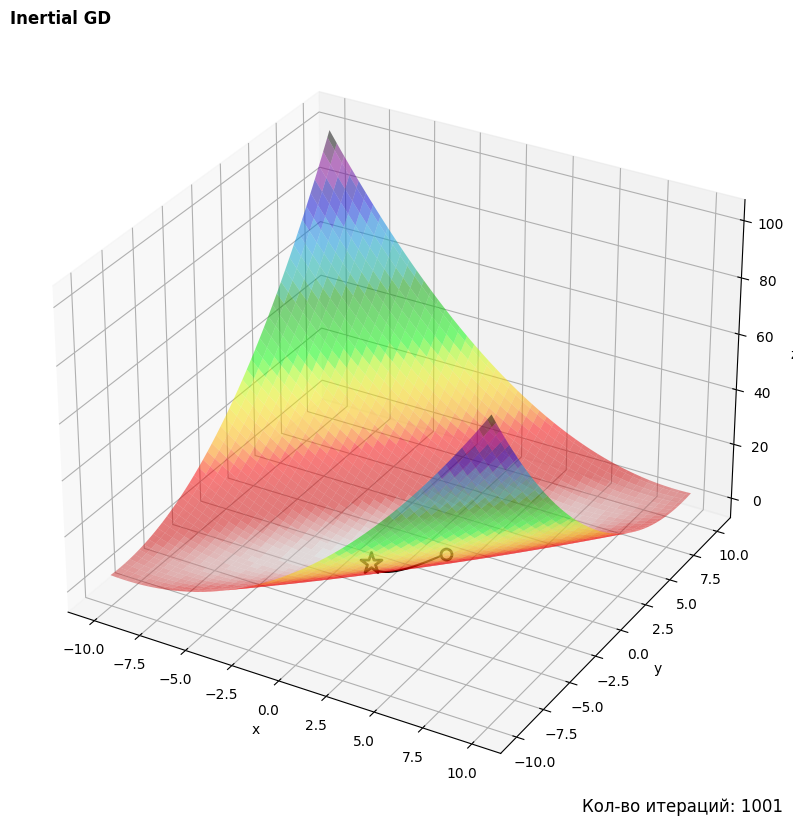

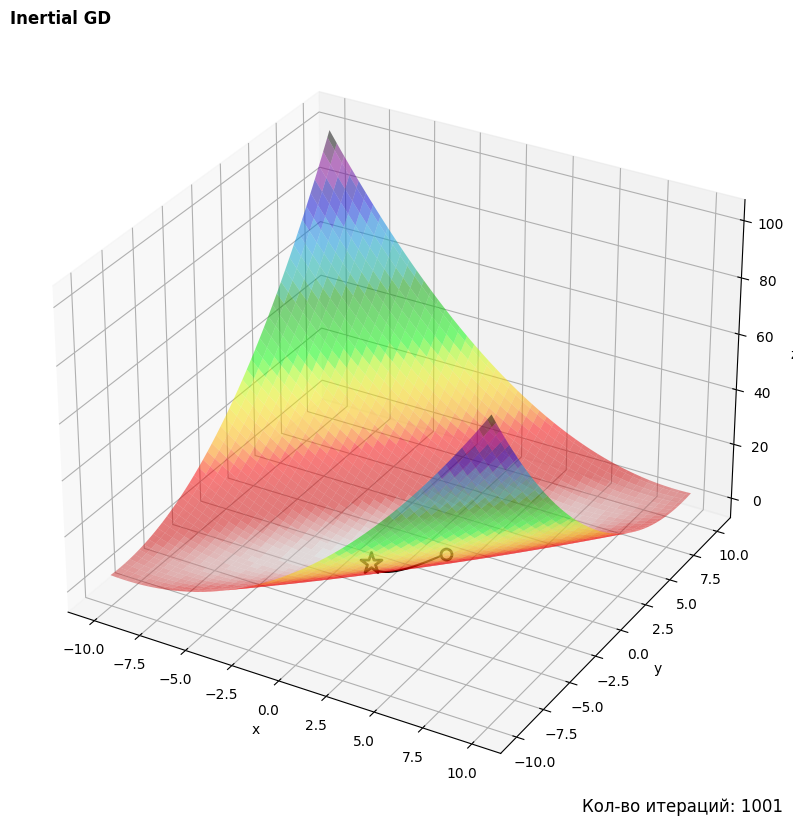

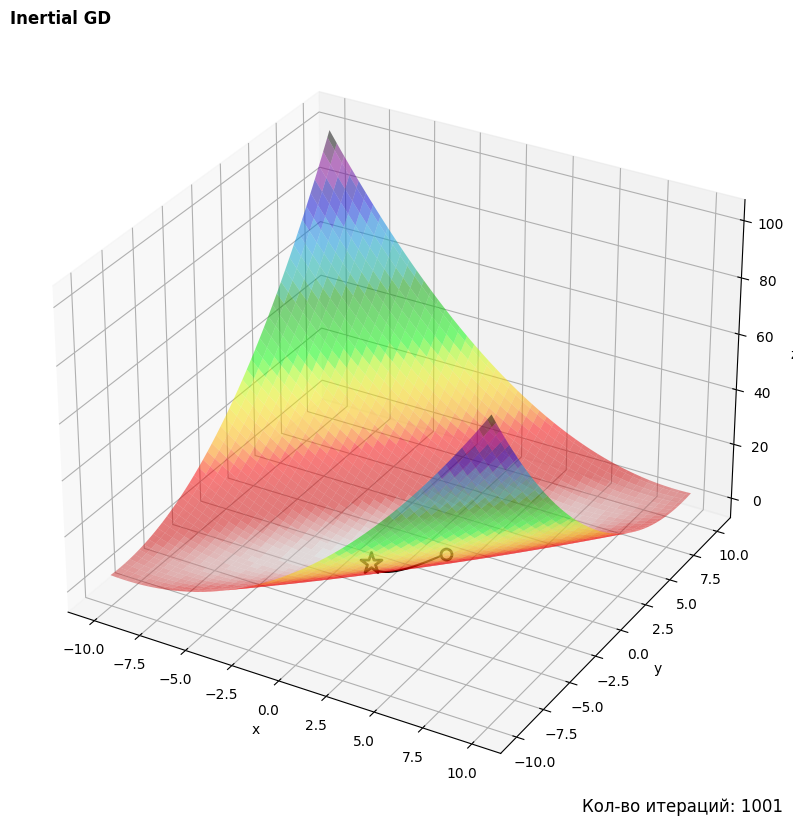

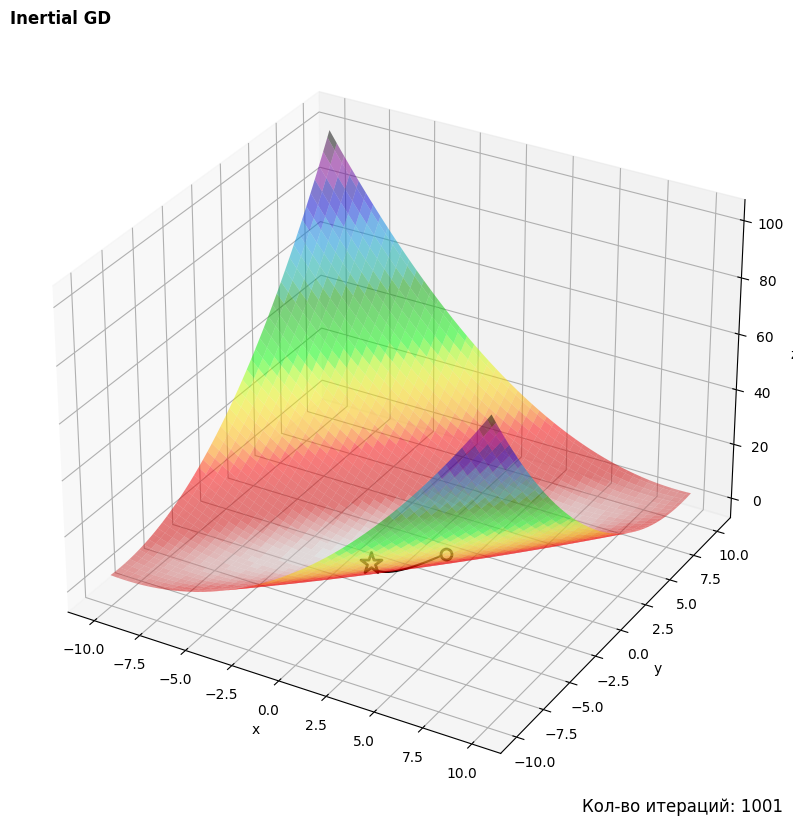

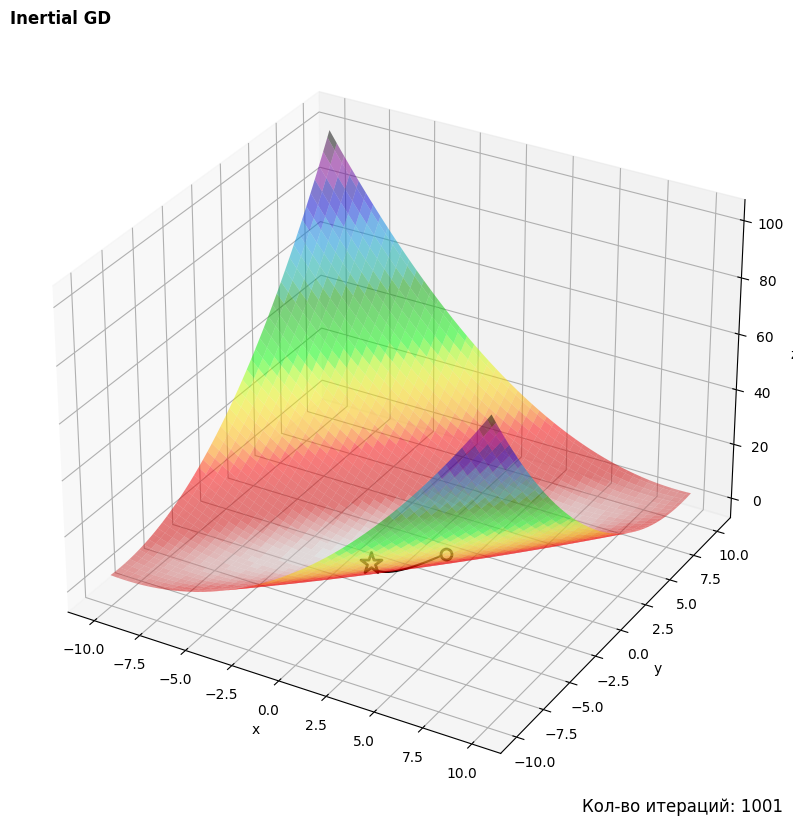

In [17]:
# Для Матьяса
for _ in range(5):
  start_time = datetime.now()
  history = moment_GD(Matyas.fuction, Matyas.gradient, np.array([5,-5]), Matyas.get_min(), max_iter = 1000, lr = 0.001)
  print("Matyas moment gd\n", datetime.now() - start_time)
  draw_result(Matyas.fuction, Matyas.get_bounds(), Matyas.get_min(), history, "Inertial GD")

Levi moment gd
 0:00:00.057357
Начальная точка:	[-1.00 5.00 20.00]
Найденный минимум:	[-9.77e-01 5.00e+00 1.99e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[1.98e+00 -4.00e+00 -1.99e+01]
Кол-во итераций:	1001
Levi moment gd
 0:00:00.032597
Начальная точка:	[-1.00 5.00 20.00]
Найденный минимум:	[-9.77e-01 5.00e+00 1.99e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[1.98e+00 -4.00e+00 -1.99e+01]
Кол-во итераций:	1001
Levi moment gd
 0:00:00.047382
Начальная точка:	[-1.00 5.00 20.00]
Найденный минимум:	[-9.77e-01 5.00e+00 1.99e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[1.98e+00 -4.00e+00 -1.99e+01]
Кол-во итераций:	1001
Levi moment gd
 0:00:00.027742
Начальная точка:	[-1.00 5.00 20.00]
Найденный минимум:	[-9.77e-01 5.00e+00 1.99e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[1.98e+00 -4.00e+00 -1.99e+01]
Кол-во итераций:	1001
Levi moment gd
 0:00:00.032833
Начальная точка:	[-1.00 5.00 20.00]
Найденный минимум:	[-9.77e-01 5.00e+00 1.99e+01]
Глобальный минимум:	[1 1 0]
Погрешность:	[1.

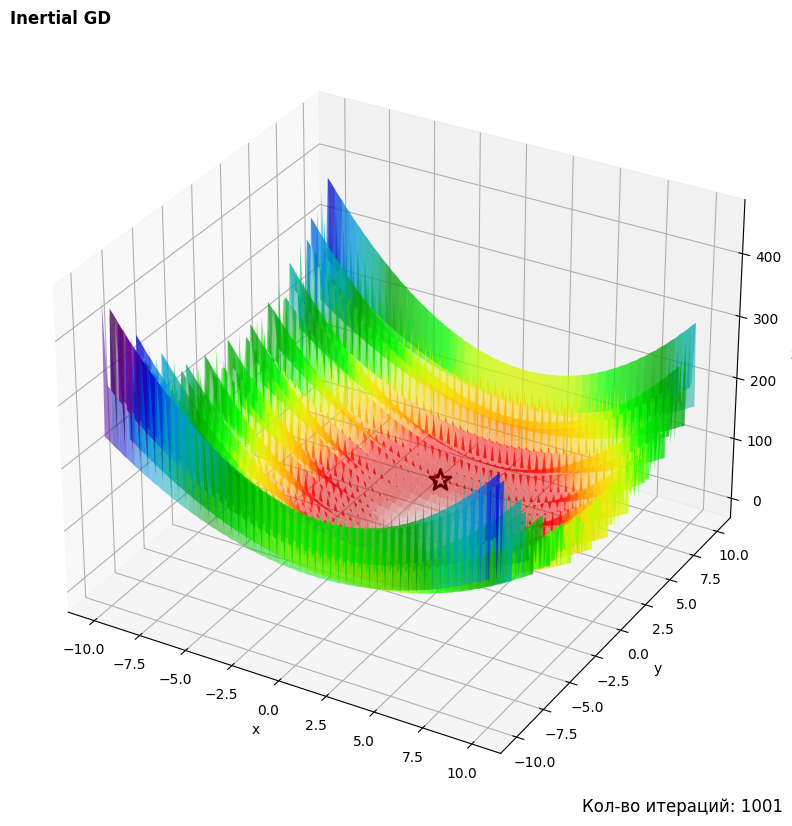

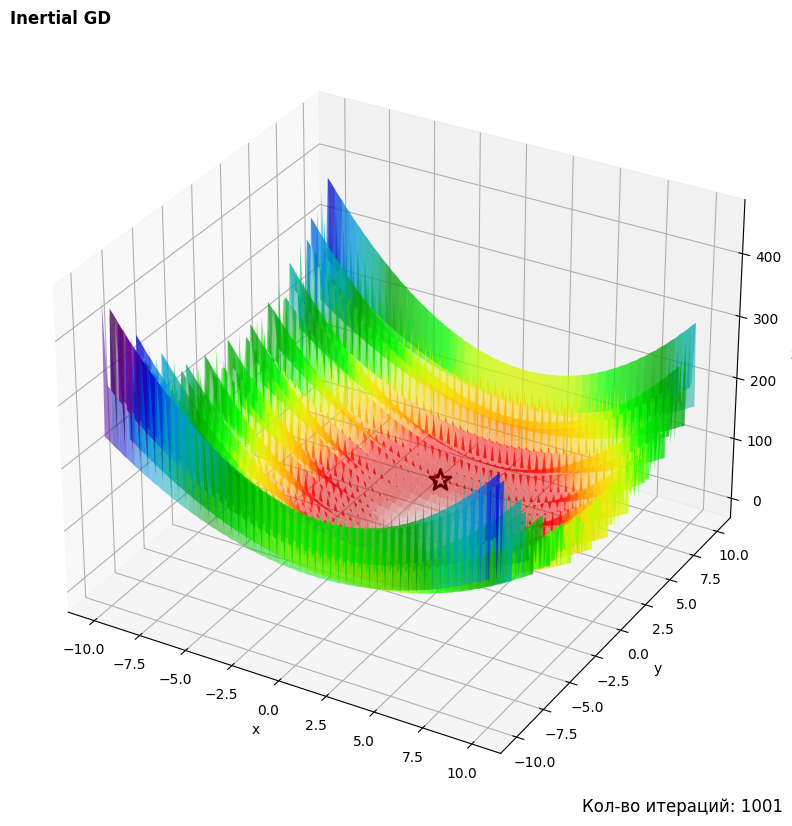

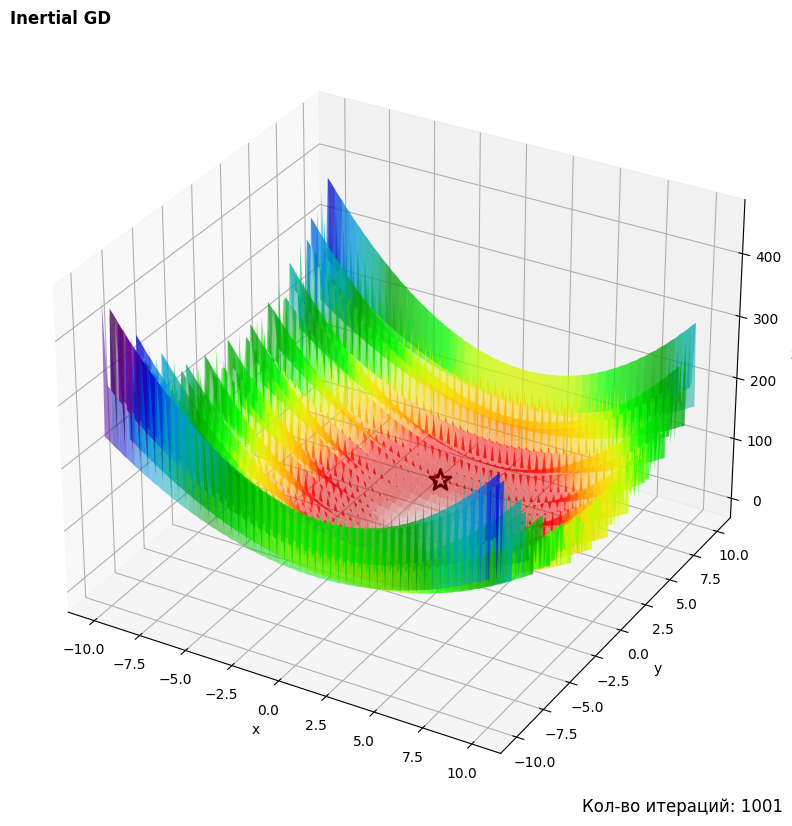

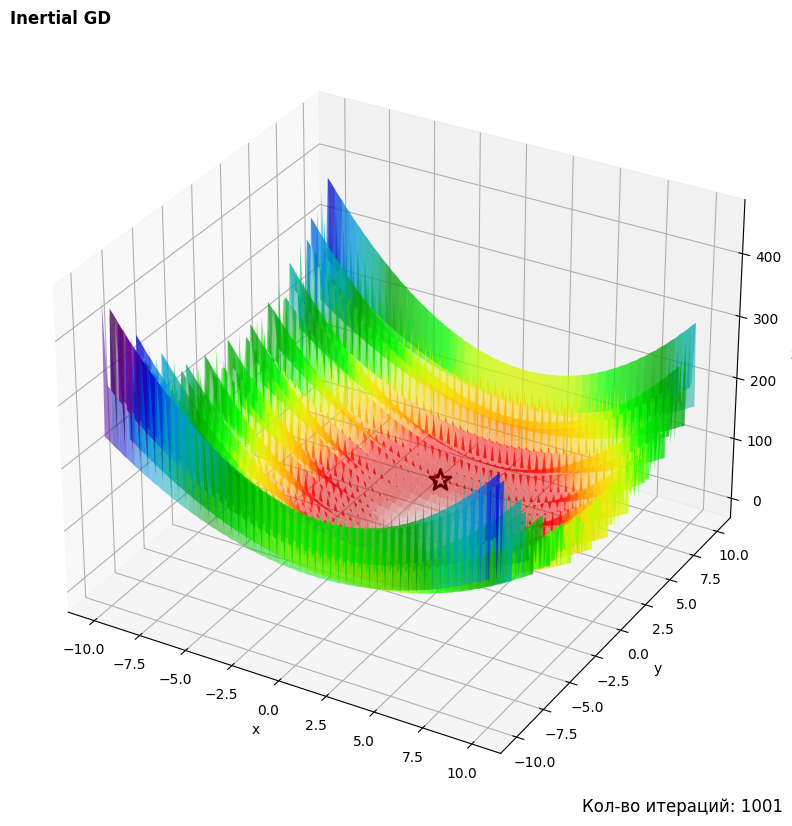

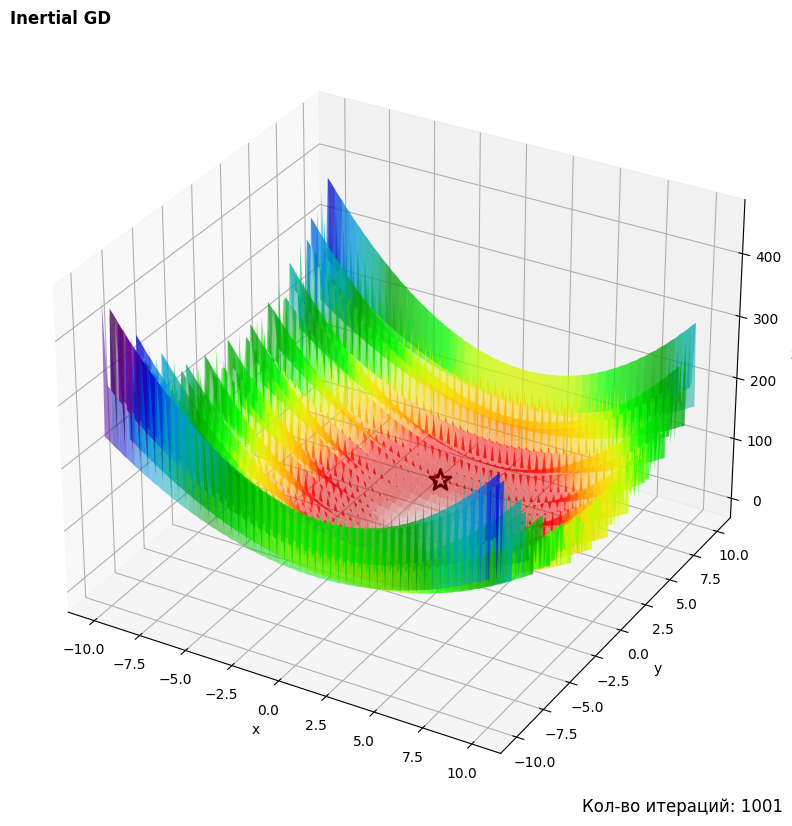

In [18]:
# Для Леви
for _ in range(5):
  start_time = datetime.now()
  history = moment_GD(Levi.fuction, Levi.gradient, np.array([-1,5]), Levi.get_min(), max_iter = 1000, lr = 0.001)
  print("Levi moment gd\n", datetime.now() - start_time)
  draw_result(Levi.fuction, Levi.get_bounds(), Levi.get_min(), history, "Inertial GD")

# **Adam модификация**

In [19]:
def adam_GD(
    func: callable, grad: callable, start_params: np.ndarray, glob_min: np.ndarray, max_iter: int = 1000,
    lr: float = 0.1, b1: float = 0.6, b2: float = 0.999, e: float = 10e-8, delta: float = 0.001
    ) -> np.array:

    # Адаптивный градиентный спуск (Adam)
    # func (callable) - функция искуственного ландшавта
    # start_params (np.ndarray) - стартовый набор параметров
    # glob_min (np.ndarray) - глобальный минимум рассматриваемой функции
    # max_iter (int, optional) - Ограничение по кол-ву итераций (1000)
    # lr=lesrning_rate (float, optional) - шаг обучения (0.1)
    # b1 (float, optional) - параметр beta1 (0.6)
    # b2 (float, optional) - параметр beta2 (0.999)
    # e (float, optional) - "бесконечно" малое число (10e-8)
    # delta (float, optional) - радиус сходимости (0.001)
    # Вывод: np.array - история градиентного спуска

    # начальный набор параметров
    params = start_params.copy()
    history = [np.array([params[0], params[1], func(params)])]

    # инициализация моментов
    m = np.array([0, 0])
    v = np.array([0, 0])

    step = 0
    while (step < max_iter and la.norm(history[-1] - glob_min) > delta):

        # считаем моменты
        m = b1 * m + (1 - b1) * grad(params)
        v = b2 * v + (1 - b2) * grad(params) ** 2

        # новое значение параметров
        params = params - lr * m / (np.sqrt(v) + e)

        # сохраняем результат
        history.append(np.array([params[0], params[1], func(params)]))
        step += 1

    return np.array(history)

Matyas adam gd
 0:00:00.001561
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[3.93e-04 -3.93e-04 1.55e-07]
Глобальный минимум:	[0 0 0]
Погрешность:	[-3.93e-04 3.93e-04 -1.55e-07]
Кол-во итераций:	28
Matyas adam gd
 0:00:00.000949
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[3.93e-04 -3.93e-04 1.55e-07]
Глобальный минимум:	[0 0 0]
Погрешность:	[-3.93e-04 3.93e-04 -1.55e-07]
Кол-во итераций:	28
Matyas adam gd
 0:00:00.003963
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[3.93e-04 -3.93e-04 1.55e-07]
Глобальный минимум:	[0 0 0]
Погрешность:	[-3.93e-04 3.93e-04 -1.55e-07]
Кол-во итераций:	28
Matyas adam gd
 0:00:00.001590
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[3.93e-04 -3.93e-04 1.55e-07]
Глобальный минимум:	[0 0 0]
Погрешность:	[-3.93e-04 3.93e-04 -1.55e-07]
Кол-во итераций:	28
Matyas adam gd
 0:00:00.002744
Начальная точка:	[5.00 -5.00 25.00]
Найденный минимум:	[3.93e-04 -3.93e-04 1.55e-07]
Глобальный минимум:	[0 0 0]
Погрешность:	[-3.93e-04 

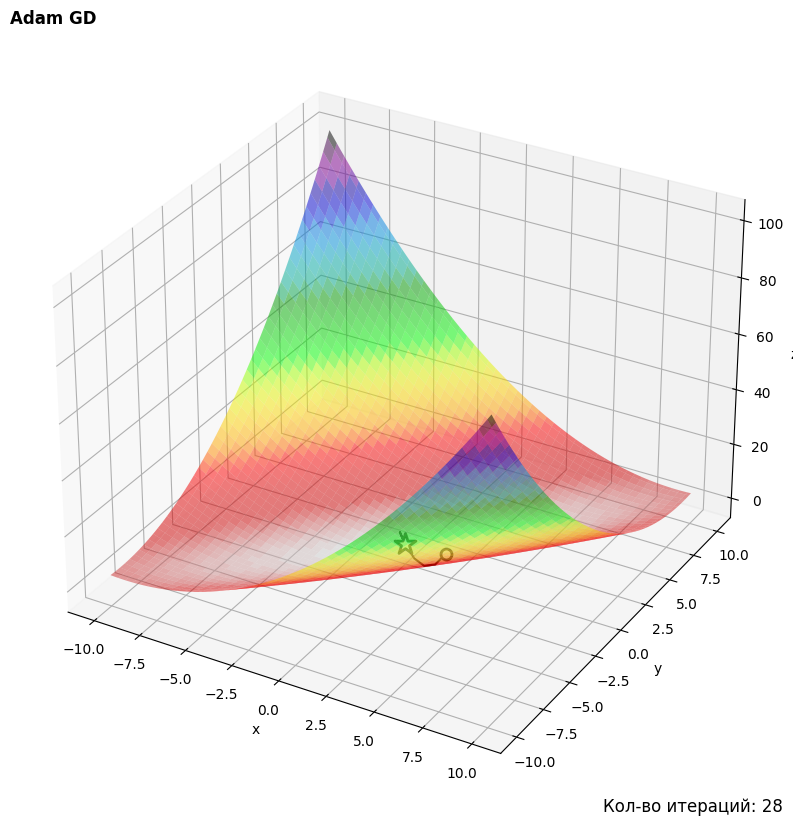

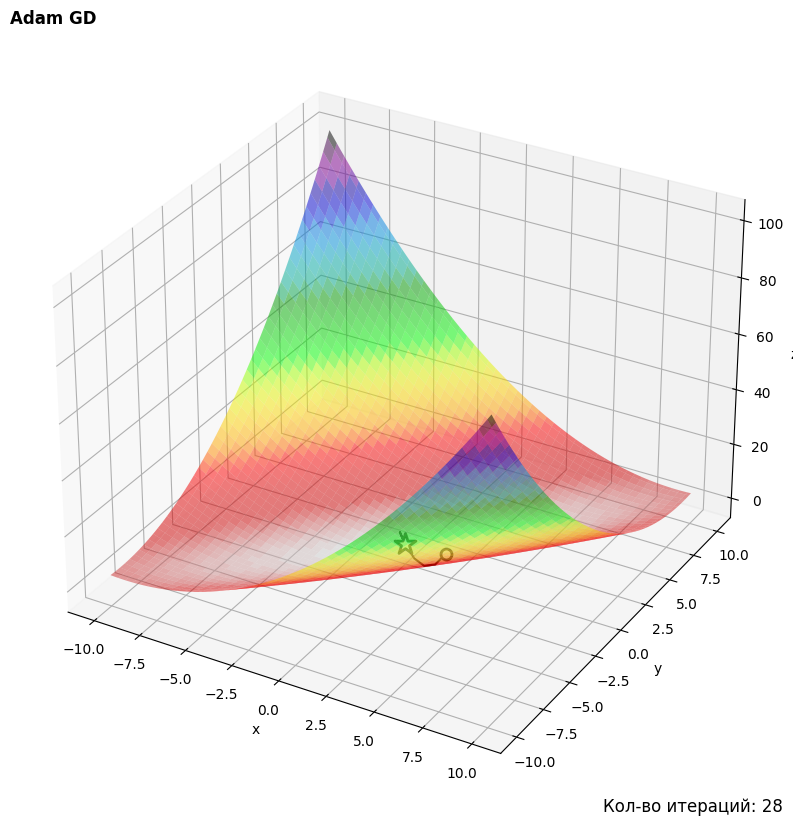

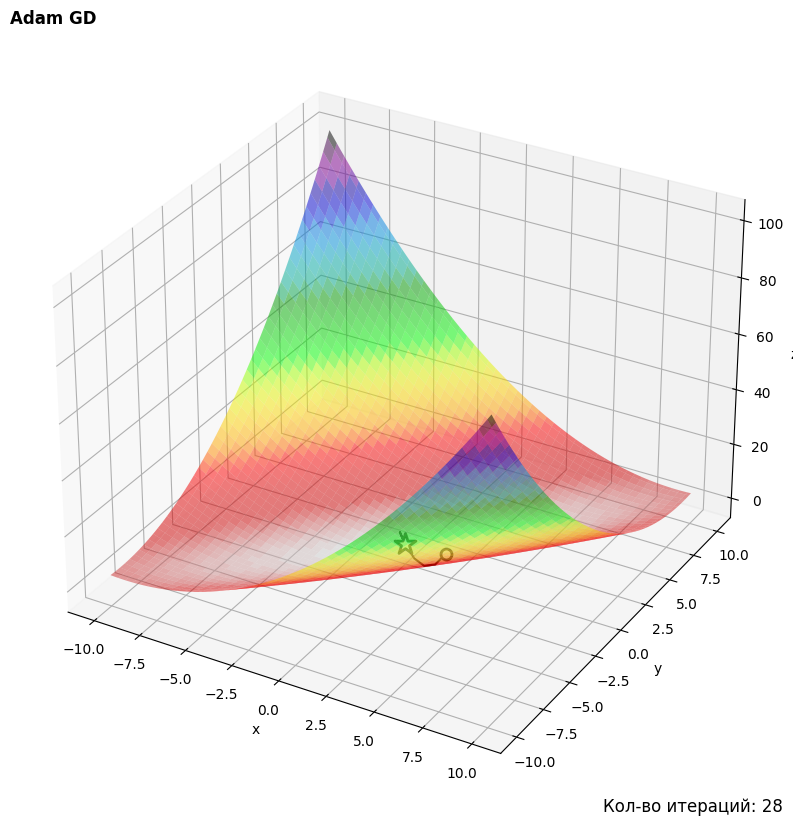

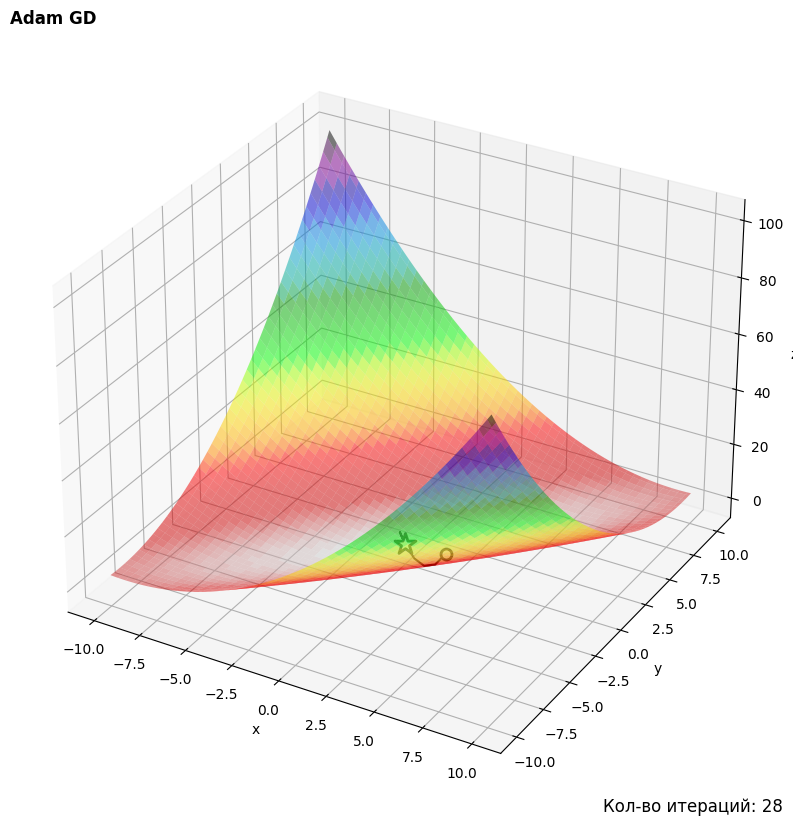

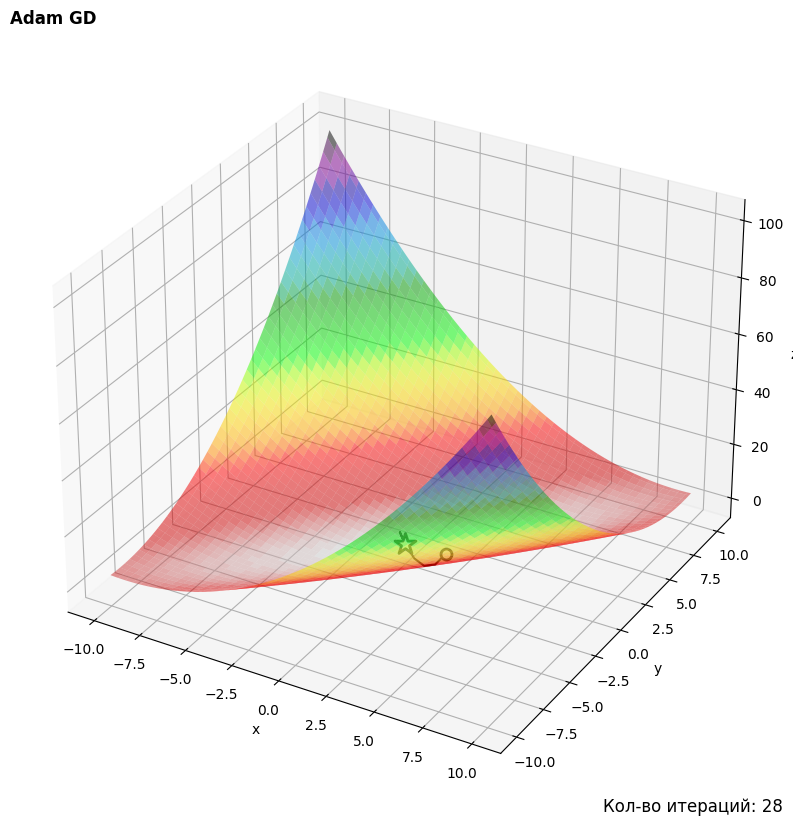

In [141]:
# Для Матьяса
for _ in range(5):
  start_time = datetime.now()
  history = adam_GD(Matyas.fuction, Matyas.gradient, np.array([5,-5]), Matyas.get_min(), max_iter = 1000, lr = 0.1)
  print("Matyas adam gd\n", datetime.now() - start_time)
  draw_result(Matyas.fuction, Matyas.get_bounds(), Matyas.get_min(), history, "Adam GD")

Levi adam gd
 0:00:00.063965
Начальная точка:	[-5.00 5.00 52.00]
Найденный минимум:	[1.97e+00 -3.89e-01 3.97e+00]
Глобальный минимум:	[1 1 0]
Погрешность:	[-9.73e-01 1.39e+00 -3.97e+00]
Кол-во итераций:	1001
Levi adam gd
 0:00:00.076642
Начальная точка:	[-5.00 5.00 52.00]
Найденный минимум:	[1.97e+00 -3.89e-01 3.97e+00]
Глобальный минимум:	[1 1 0]
Погрешность:	[-9.73e-01 1.39e+00 -3.97e+00]
Кол-во итераций:	1001
Levi adam gd
 0:00:00.067820
Начальная точка:	[-5.00 5.00 52.00]
Найденный минимум:	[1.97e+00 -3.89e-01 3.97e+00]
Глобальный минимум:	[1 1 0]
Погрешность:	[-9.73e-01 1.39e+00 -3.97e+00]
Кол-во итераций:	1001
Levi adam gd
 0:00:00.066124
Начальная точка:	[-5.00 5.00 52.00]
Найденный минимум:	[1.97e+00 -3.89e-01 3.97e+00]
Глобальный минимум:	[1 1 0]
Погрешность:	[-9.73e-01 1.39e+00 -3.97e+00]
Кол-во итераций:	1001
Levi adam gd
 0:00:00.047456
Начальная точка:	[-5.00 5.00 52.00]
Найденный минимум:	[1.97e+00 -3.89e-01 3.97e+00]
Глобальный минимум:	[1 1 0]
Погрешность:	[-9.73e-01 1.

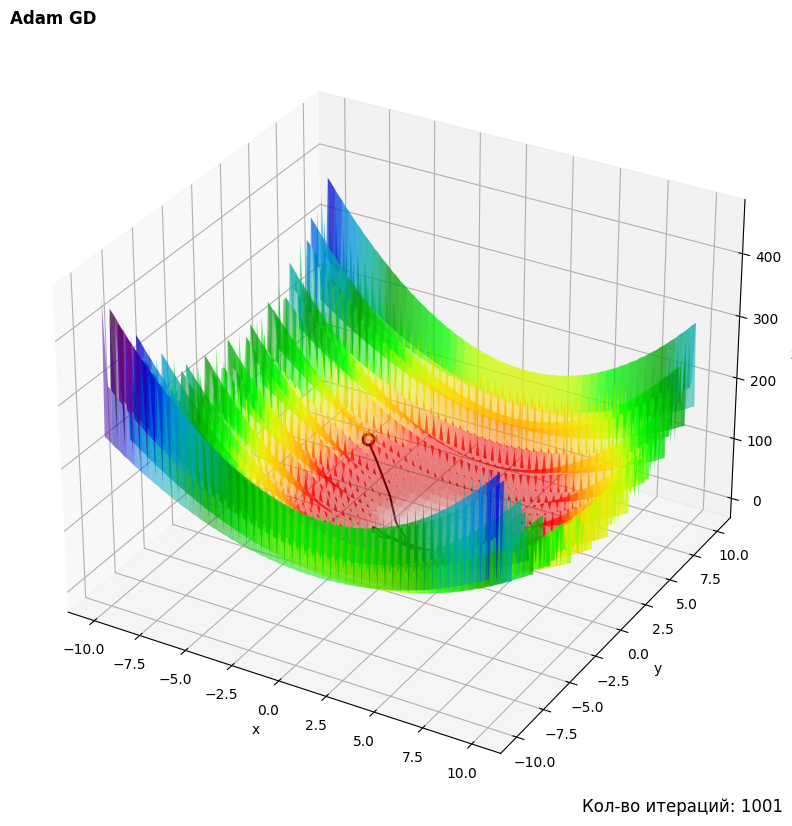

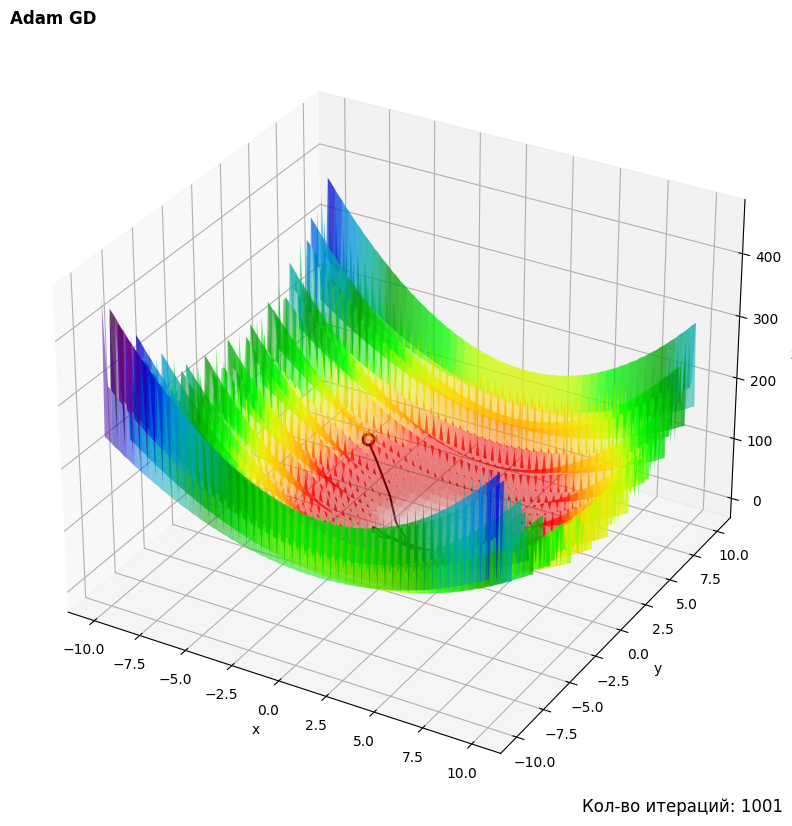

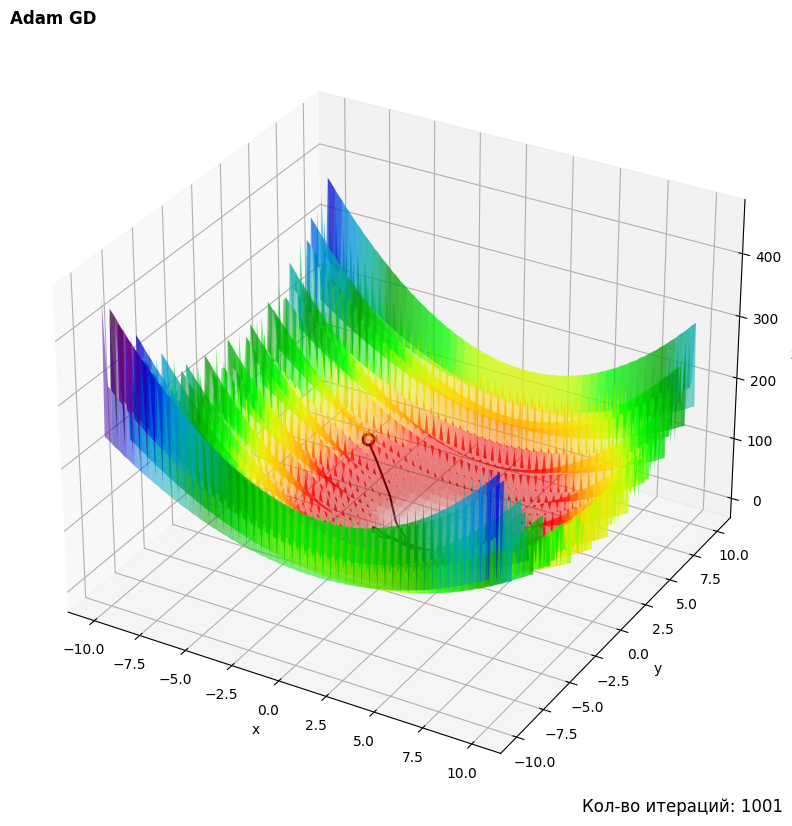

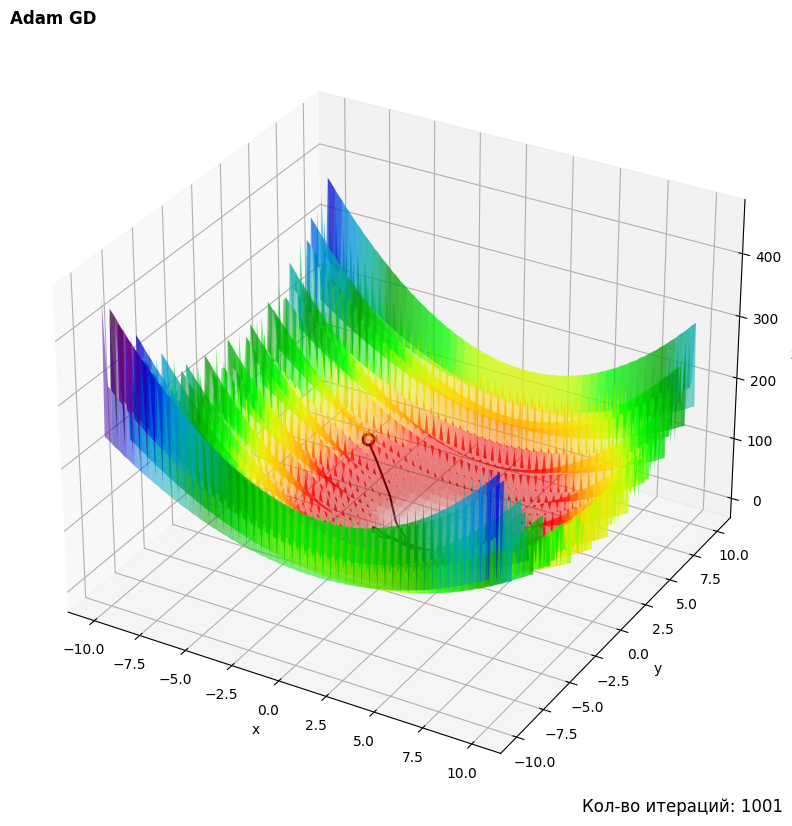

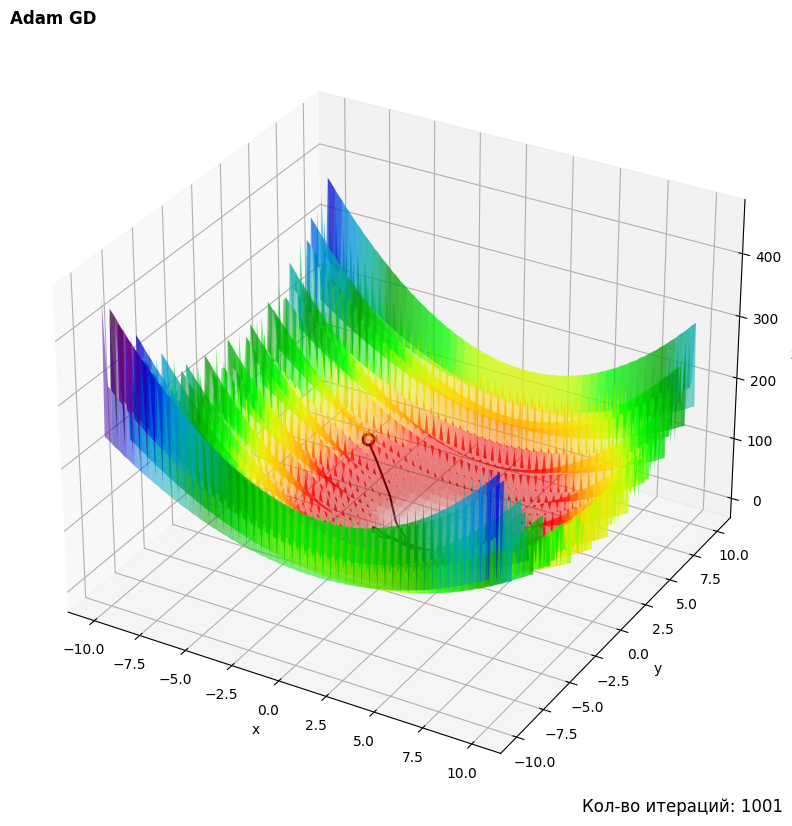

In [142]:
# Для Леви
for _ in range(5):
  start_time = datetime.now()
  history = adam_GD(Levi.fuction, Levi.gradient, np.array([-5,5]), Levi.get_min(), max_iter = 1000, lr = 0.1)
  print("Levi adam gd\n", datetime.now() - start_time)
  draw_result(Levi.fuction, Levi.get_bounds(), Levi.get_min(), history, "Adam GD")

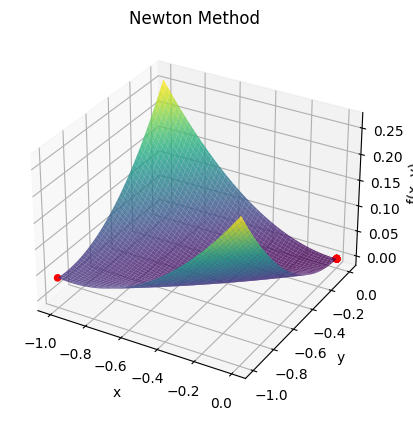

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Задаем функцию
def f(x, y):
  return 0.26 * (x**2 + y**2) - 0.48 * x * y

# Берем градиент
def g(x):
  return np.array([0.52 * x[0] - 0.48 * x[1], 0.52 * x[1] - 0.48 * x[0]])

# Задаем матрицу Гесса
def h(x):
  return np.array([[0.52, -0.48], [-0.48, 0.52]])


def newton_method(f, g, h, initial_point):
    history = []  # Зададим список для хранения истории точек
    point = initial_point

    for _ in range(100):  # Зададим максимальное количество итераций
        history.append(point)
        grad = g(point)
        hessian = h(point)
        delta = np.linalg.solve(hessian, grad)
        point = point - delta

    return history

def draw_result_func(f, history):
    x_vals = [point[0] for point in history]
    y_vals = [point[1] for point in history]
    z_vals = [f(point[0], point[1]) for point in history]

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Генерация сетки X, Y
    x = np.linspace(min(x_vals), max(x_vals), 100)
    y = np.linspace(min(y_vals), max(y_vals), 100)
    X, Y = np.meshgrid(x, y)
    Z = f(X, Y)

    # Построение поверхности
    ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)
    ax.scatter(x_vals, y_vals, z_vals, c='r', marker='o')

    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('f(x, y)')

    plt.title('Newton Method')

    plt.show()

# Зададим начальную точку
initial_point = np.array([-1, -1])

history = newton_method(f, g, h, initial_point)

draw_result_func(f, history)